# 0. Collecting Twitter Data

In [ ]:
#Exploratory extraction

#PACKAGES: 
#basic:
#install.packages('twitteR')
#install.packages('RCurl') #notice capital and lower cases

# Load this packages
library(twitteR)
library (RCurl)

####AUTHORIZATION#####
#FOLLOW PROTOCOL TO GAIN ACCESS TO TWITTER API

# Get OAuth credentials.  Need to copy the access token and access token secret as well.  
#Run this code EACH TIME you are using twitteR.

# consumerKey <- 'own_information'
# consumerSecret <- 'own_information'
# accessToken <- 'own_information'
# accessTokenSecret <- 'own_information'

# setup_twitter_oauth(consumer_key = consumerKey, consumer_secret = consumerSecret, access_token = accessToken, access_secret = accessTokenSecret)  
# When prompted about using a local file, select 1 or 2.

# ####WORKING WITH FIRST CODE#####

# Set working directory
# setwd('/Users/daniel/Documents/TWITTER_TRENDS/data1')  # The working directory is where output will save to by default.

# How many tweets to return per query
# size <- 10000  # Modify as needed.  Note that Twitter only returns 100 tweets per query; the package twitteR internally handles code asking for more than 100 requests.

# One word original example
# measles <- searchTwitter('measles', n = size) # Also returns hashtags, and Twitter is not case sensitive.
# measles_df <- twListToDF(measles) #transform return value to dataframe
# Could shorten these two lines to measles_tweets <- twListToDF(searchTwitter('measles', n = 10000))

# max(measles_tweets_df$created) - min(measles_tweets_df$created)  # time!
# Keywords implementation (meeting 25-09-2018) 

vaccinefreedom = searchTwitter ('vaccinefreedom', n = size) #keyword
vaccineinjury = searchTwitter ('vaccineinjury', n = size) #keyword
consent_vaccines = searchTwitter ('consent AND vaccines', n = size) #concept word
measles = searchTwitter ('measles', n = size) # keyword
 
# transform to dataframes
# vaccinefreedom_df = twListToDF(vaccinefreedom)
# vaccineinjury_df = twListToDF(vaccineinjury)
# consent_vaccines_df = twListToDF(consent_vaccines)
# measles_df = twListToDF(measles)

# export for saving as textfiles 

# write.csv (vaccinefreedom_df, file = 'VaccinefreedomTweets.csv') #avoid .csv to obtain a plain text file 
# write.csv (vaccineinjury_df, file = 'vaccineinjuryTweets.csv') 
# write.csv (consent_vaccines_df, file = 'ConsentTweets.csv') 
# write.csv (measles_df, file = 'MeaslesTweets.csv') 


# Write as a text
# write.table(vaccinefreedom_df, 'VaccinefreedomTweets.txt')  # Saves to your working directory
# write.table(vaccineinjury_df, 'vaccineinjuryTweets.txt')  # Saves to your working directory
# write.table(consent_vaccines_df, 'ConsentTweets.txt')  # Saves to your working directory
# write.table(measles_df, 'MeaslesTweets.txt')  # Saves to your working directory

In [ ]:
install.packages("RCurl")

# 1. Twitter Testing

In [ ]:
# Setting up API keys and tokens (these comes from developer.twitter.com)
consumerKey <- "o82CIPB0SHTbn1vxJn2SUG0YJ"
consumerSecret <- "xv7aYTCH9Ks05MHB0NujvYEyy1eNr2X2jyIjwilAwPZxzNEIuD"
accessToken <- "1044689406874005504-BttOGUgC8iJeTwhGCRcWlJbaDSE9sV"
accessTokenSecret <- "8xy7k4god2LpbjvabQs2wDcNgI1ICuyi6jF6mtccO41ka"

# Setting up Twitter connection
setup_twitter_oauth(consumerKey, consumerSecret, accessToken, accessTokenSecret)

In [ ]:
# Getting tweets
measleTweets <- twListToDF(searchTwitter("measles", n=100, lang="en"))
head(measleTweets,20)

In [ ]:
# Getting trend information
trend <- availableTrendLocations()
trend

# Getting Worldwide Twitter trend information
head(getTrends(1),5)

# Getting United States Twitter trend information
head(getTrends(23424977),5)

In [ ]:
# Getting information from a particular account
account.timeline <- userTimeline("realdonaldtrump", n=1000, includeRts=TRUE)
account.df <- twListToDF(account.timeline)
head(account.timeline)
head(account.df)

## 1.1 Understanding Various Twitter Functions

In [ ]:
# Using favorite function to get Dr. Joseph Mercola
userFav <- twListToDF(favorites("mercola", n=20))
head(userFav,5)

# Using lookupUsers
users <- lookupUsers(c("mercola", "NVICLoeDown"))
users$mercola

# Looking at retweet Twitter data
retweets("1035117120735137792")
st <- showStatus("1035117120735137792")
retweeters(st$getId())

In [ ]:
# Getting a user's timeline information:
twListToDF(userTimeline("mercola", n=20, maxID=NULL, sinceID=NULL, includeRts=FALSE,
excludeReplies=FALSE))

## 1.2 Exploratory Extraction

In [ ]:
searchTwitter("#measles -filter:retweets",n = 20)

In [ ]:
measleTweets <- twListToDF(searchTwitter("measles", n=20))
head(measleTweets,5)

measleTweetshash <- twListToDF(searchTwitter("#measles", n=20))
head(measleTweetshash,5)

# Post retweet strip
no_retweets <- twListToDF(strip_retweets(searchTwitter("measles",n=20)))
head(no_retweets)

# Pre retweet strip
measlesNoRT <- twListToDF(searchTwitter("#measles -filter:retweets",n = 20))
head(measlesNoRT,5)

In [ ]:
# Search Twitter for keywords related to measles and anti-vax
n <- 1000
measles <- searchTwitter('measles', n = size)
vaccinefreedom <- twListToDF(searchTwitter('vaccinefreedom', n = size)) #keyword
vaccineinjury <- twListToDF(searchTwitter('vaccineinjury', n = size)) #keyword
consent_vaccines <- twListToDF(searchTwitter('consent AND vaccines', n = size)) #concept word

# Export as csv and text files 
# write.csv (measles, file = 'MeaslesTweets.csv') 
# write.csv (vaccinefreedom, file = 'VaccinefreedomTweets.csv') #avoid .csv to obtain a plain text file 
# write.csv (vaccineinjury, file = 'vaccineinjuryTweets.csv') 
# write.csv (consent_vaccines, file = 'ConsentTweets.csv') 

# write.table(measles, 'MeaslesTweets.txt') 
# write.table(vaccinefreedom, 'VaccinefreedomTweets.txt')  # Saves to your working directory
# write.table(vaccineinjury, 'vaccineinjuryTweets.txt')  # Saves to your working directory
# write.table(consent_vaccines, 'ConsentTweets.txt')  # Saves to your working directory

## 1.3.1 Exploratory Graphing: Confirmed Cases

In [68]:
# Make sure install the readxl and xlsx libraries
install.packages('readxl')
# Load neccesary libraries
library(readxl)

measlesByState <- read_excel("US Measles cases 2008.2018_V3.xlsx", sheet=1)
measlesByState 


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


State,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,source
Alabama,0,0,0,0,0,0,1,0,1,0,NA,NA
Alaska,0,0,0,0,0,0,0,0,0,0,NA,NA
Arizona,14,0,1,2,2,1,3,7,31,0,NA,NA
Arkansas,2,0,0,0,4,0,0,0,0,0,NA,source for 2008-2014
California,17,9,27,31,8,17,92,109,24,15,NA,NA
Colorado,0,0,0,0,0,2,1,1,2,0,NA,NA
Connecticut,0,0,1,1,1,0,5,0,1,0,NA,https://www.cdc.gov/mmwr/mmwr_nd/index.html
Delware,0,NA,0,1,1,0,0,1,0,0,NA,NA
District of Colombia,1,2,0,NA,1,1,0,3,0,1,NA,NA
Flordia,1,5,1,8,0,7,0,5,5,3,NA,NA


Using State as id variables


State,variable,value
Alabama,2008,0
Alaska,2008,0
Arizona,2008,14
Arkansas,2008,2
California,2008,17
Colorado,2008,0
Connecticut,2008,0
Delware,2008,0
District of Colombia,2008,1
Flordia,2008,1


Warning message:
“Removed 2 rows containing missing values (position_stack).”Warning message:
“Removed 2 rows containing missing values (position_stack).”

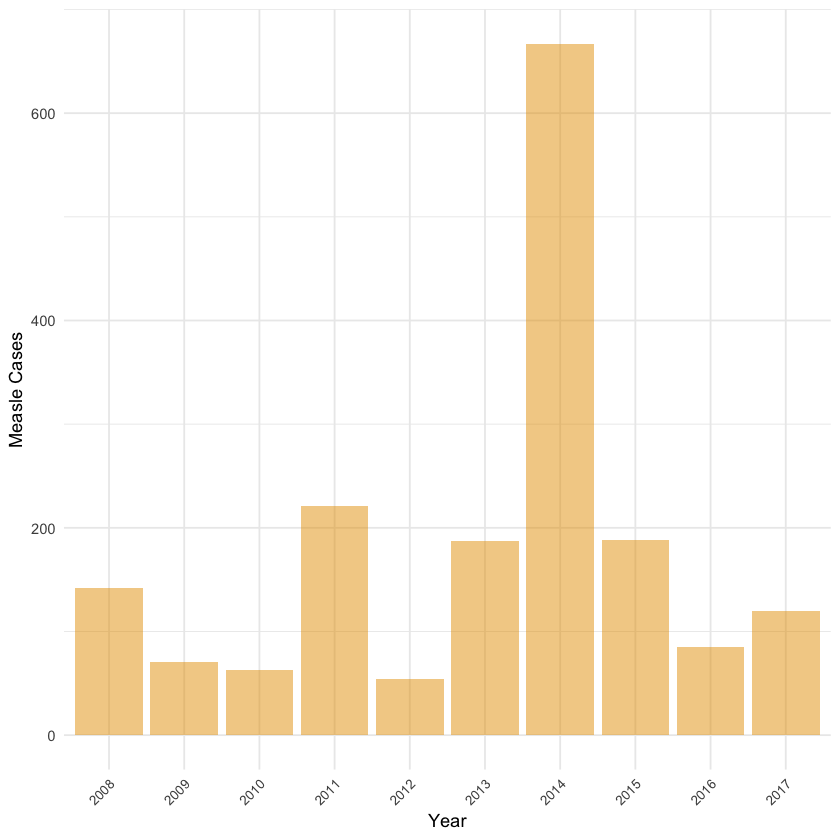

Warning message:
“Removed 2 rows containing missing values (position_stack).”

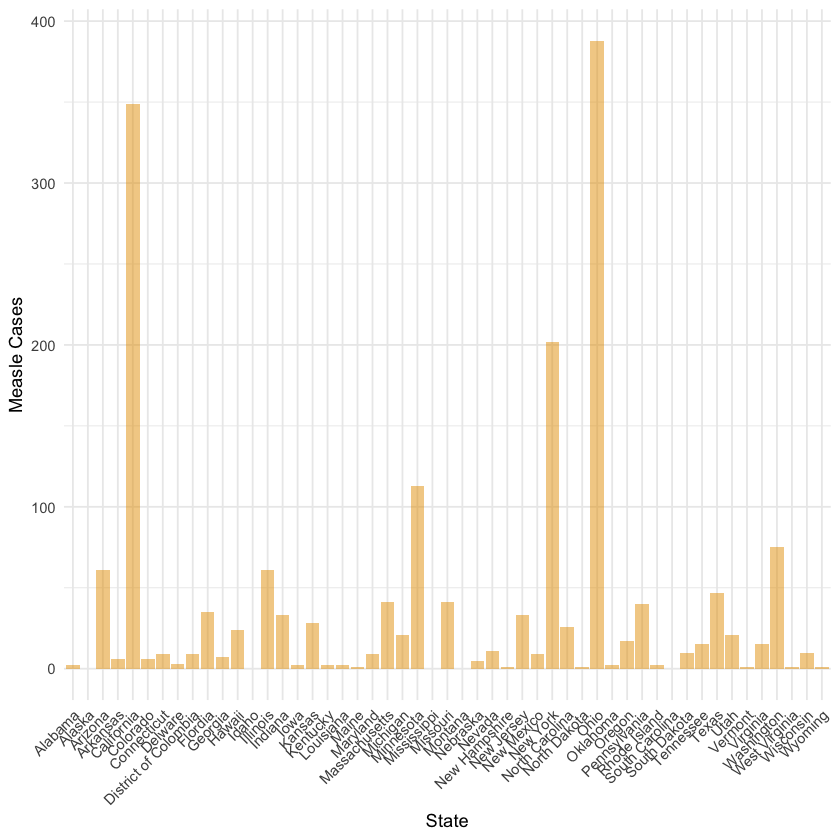

Warning message:
“Removed 2 rows containing missing values (position_stack).”

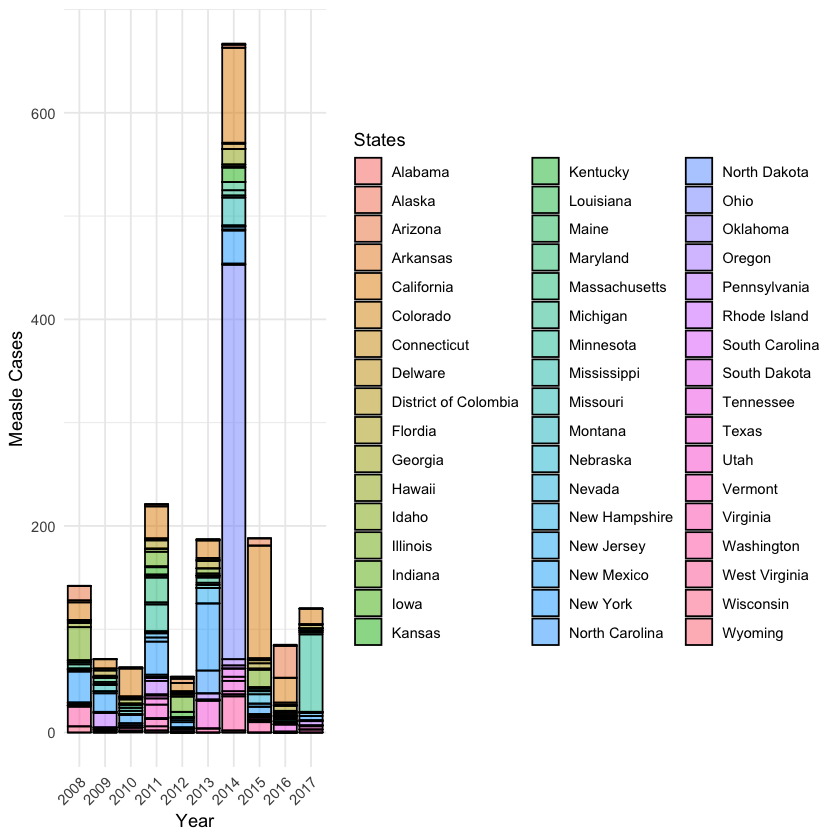

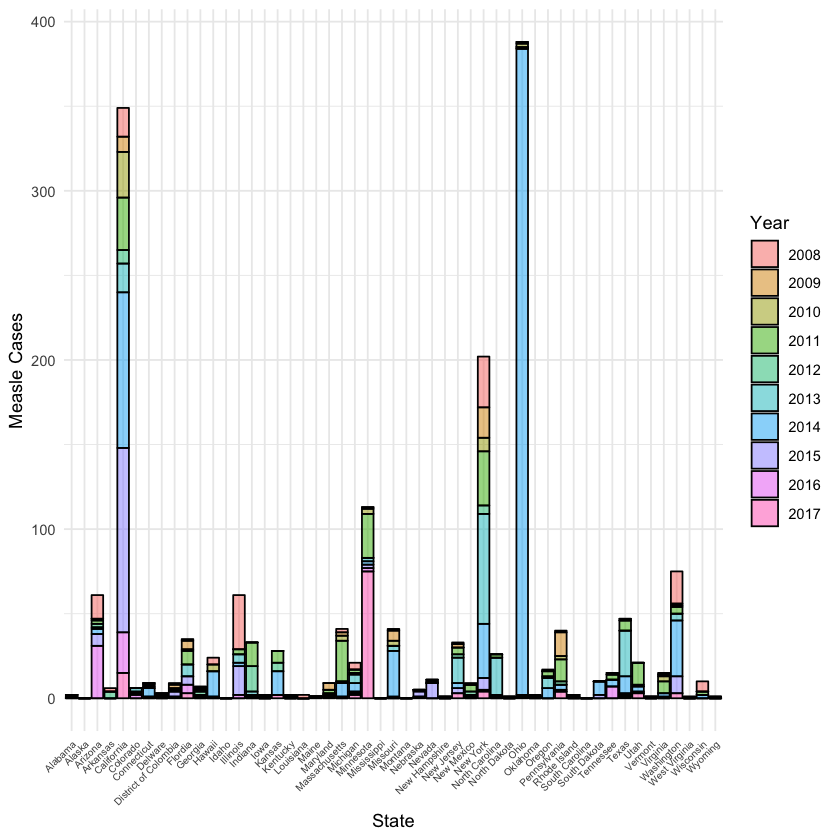

In [69]:
# Let's do some basic plotting of the data:
# Load necceasry libraries:
library(ggplot2)
library(reshape2)

# Remove total from data from because it's confusing
measlesByStateNoTotal <- measlesByState[1:length(measlesByState$State)-1,]

# Remove 2018 and source column from data from because it's confusing
# Note: ncol(data.frame) returns the last column
measlesByStateNoTotal <- measlesByStateNoTotal[,-c(ncol(measlesByStateNoTotal)-1,ncol(measlesByStateNoTotal))]

# Use the melt function to create an easier plotting structure
measlesByStatePlot <- melt(measlesByStateNoTotal)

# Take a look at the first 100 values
head(measlesByStatePlot,100)

options(repr.plot.width=7, repr.plot.height=7)

# Let's visualzie this:
(ggplot(measlesByStatePlot, aes(x=variable, y=value)) 
 + theme_minimal() + labs(x = "Year", y = "Measle Cases") 
 + geom_bar(stat="identity", alpha = 0.5, fill="#E69F00") + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 8))) 

(ggplot(measlesByStatePlot, aes(x=State, y=value)) 
 + theme_minimal() + labs(x = "State", y = "Measle Cases") 
 + geom_bar(stat="identity", alpha = 0.5, fill="#E69F00") + theme(axis.text.x = element_text(angle = 45, hjust = 1))) 

(ggplot(measlesByStatePlot, aes(x=variable, y=value, fill=State)) 
 + theme_minimal() + labs(x = "Year", y = "Measle Cases", fill = "States") 
 + geom_bar(stat="identity", alpha = 0.5, color = "black") + theme(axis.text.x = element_text(angle = 45, hjust = 1))) 

(ggplot(measlesByStatePlot, aes(x=State, y=value, fill=variable)) 
 + theme_minimal() + labs(x = "State", y = "Measle Cases", fill = "Year") 
 + geom_bar(stat="identity", alpha = 0.5, color = "black") + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6))) 

Warning message:
“Removed 2 rows containing missing values (position_stack).”Warning message:
“Removed 2 rows containing missing values (position_stack).”

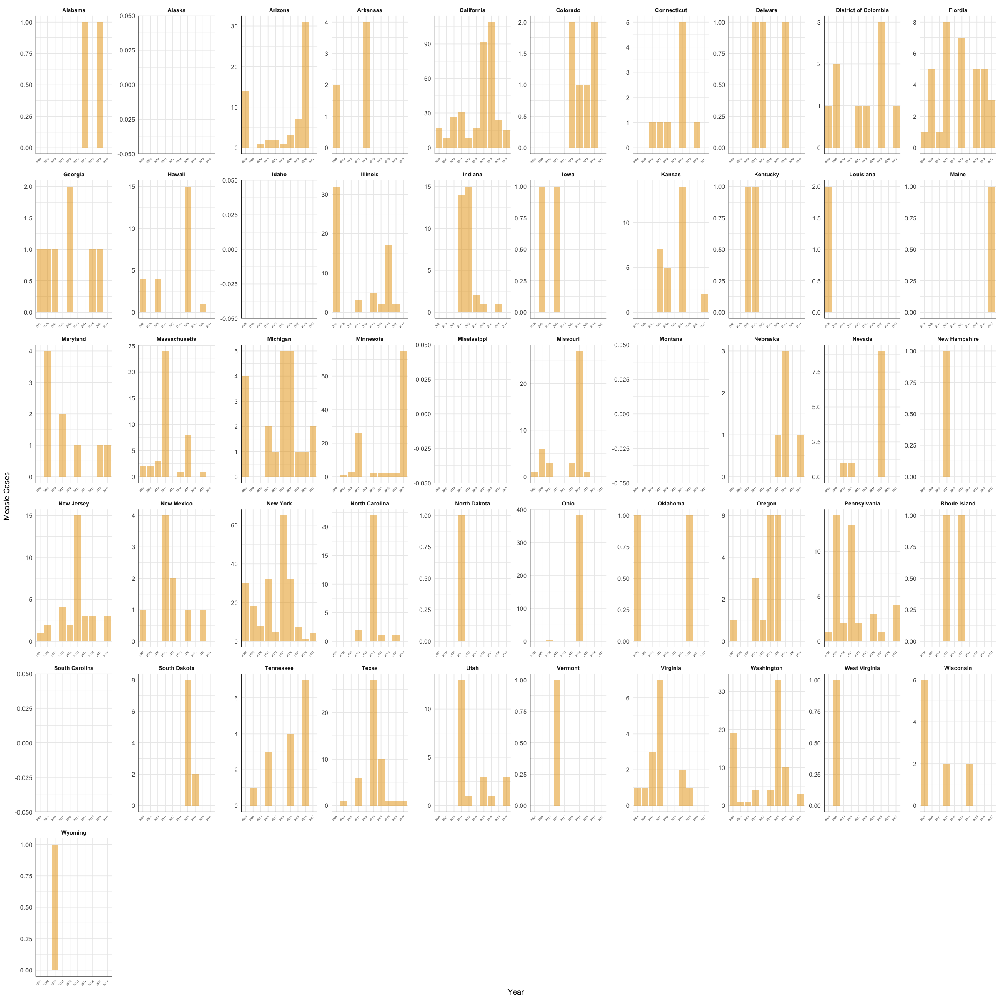

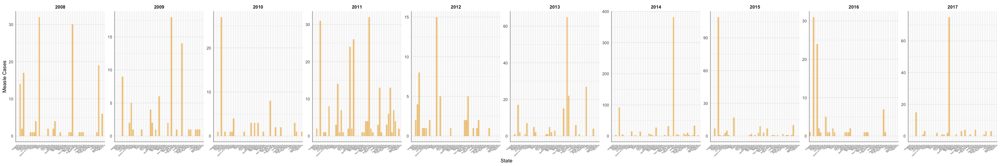

In [71]:
# I want to make a plot with multiple grids:
options(repr.plot.width=20, repr.plot.height=20)
(ggplot(measlesByStatePlot, aes(x=variable, y=value)) 
 + theme_minimal() + labs(x = "Year", y = "Measle Cases") 
 + geom_bar(stat="identity", alpha = 0.5, fill="#E69F00") 
 + facet_wrap(~ State, ncol=10, scales="free")
 + theme(strip.text = element_text(face="bold", size=8))
 + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 4))
 + annotate("segment", x=-Inf, xend=Inf, y=-Inf, yend=-Inf)
 + annotate("segment", x=-Inf, xend=-Inf, y=-Inf, yend=Inf)
) 

options(repr.plot.width=30, repr.plot.height=5)
(ggplot(measlesByStatePlot, aes(x=State, y=value)) 
 + theme_minimal() + labs(x = "State", y = "Measle Cases") 
 + geom_bar(stat="identity", alpha = 0.5, fill="#E69F00") 
 + facet_wrap(~ variable, ncol=10, scales="free")
 + theme(strip.text = element_text(face="bold", size=10))
 + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 4))
 + annotate("segment", x=-Inf, xend=Inf, y=-Inf, yend=-Inf)
 + annotate("segment", x=-Inf, xend=-Inf, y=-Inf, yend=Inf)
) 

Warning message:
“Removed 303 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”

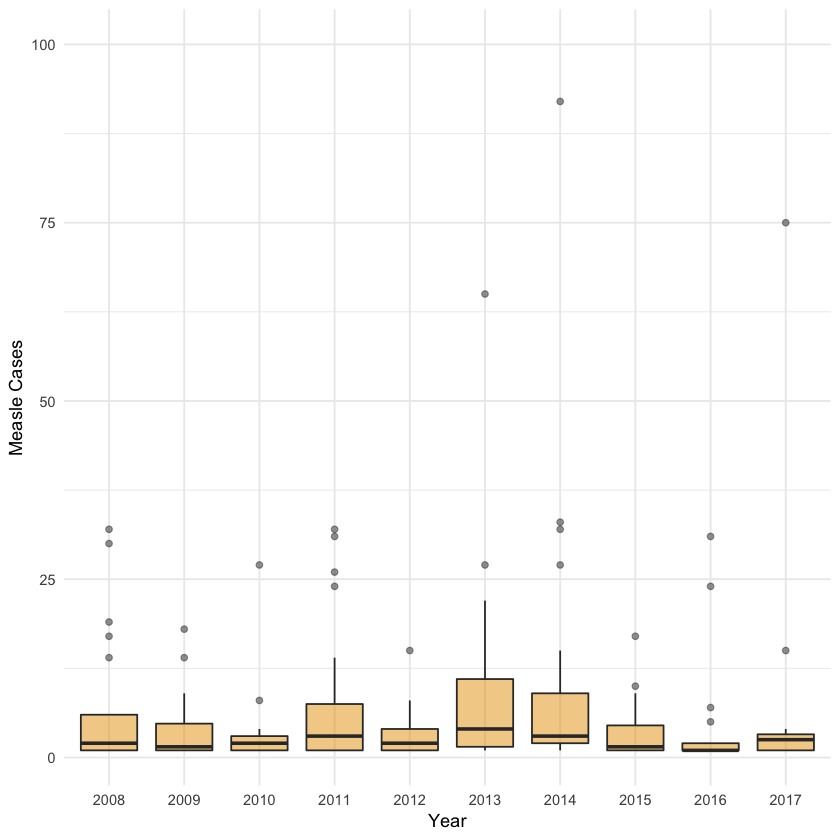

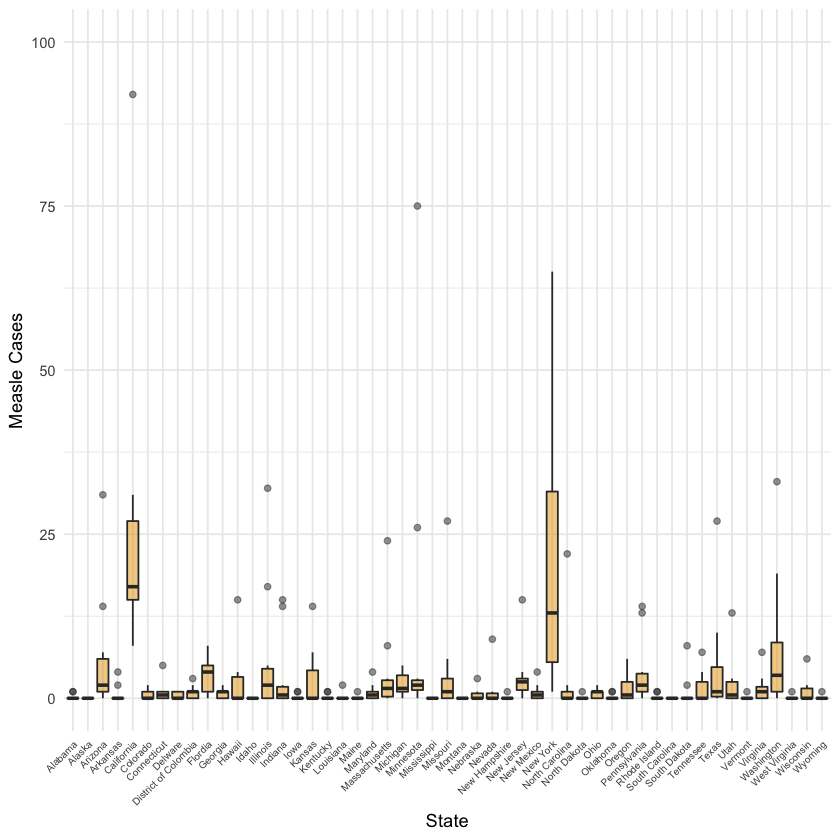

In [72]:
# Generate boxplot for Cases vs. Year: 
options(repr.plot.width=7, repr.plot.height=7)
(ggplot(measlesByStatePlot, aes(x=variable, y=value)) 
 + theme_minimal() + labs(x = "Year", y = "Measle Cases") 
 + geom_boxplot(alpha = 0.5, fill="#E69F00") + ylim(1,100)) # Remove outliers...

# Generate boxplot for Cases vs. State: 
(ggplot(measlesByStatePlot, aes(x=State, y=value)) 
 + theme_minimal() + labs(x = "State", y = "Measle Cases") 
 + geom_boxplot(alpha = 0.5, fill="#E69F00") + ylim(0,100) # Remove outliers...
 + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)))

## 1.3.2 Exploratory Graphing: Endemicity

In [4]:
install.packages("readxl")
install.packages("stringr")
install.packages("tidyverse")
install.packages("xlsx")


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages

The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


also installing the dependencies ‘highr’, ‘markdown’, ‘xfun’, ‘knitr’, ‘yaml’, ‘tinytex’, ‘generics’, ‘DBI’, ‘ellipsis’, ‘rmarkdown’, ‘selectr’, ‘broom’, ‘dbplyr’, ‘forcats’, ‘haven’, ‘lubridate’, ‘modelr’, ‘readr’, ‘reprex’, ‘rvest’, ‘tidyr’, ‘xml2’




  There is a binary version available but the source version is later:
      binary source needs_compilation
knitr   1.20   1.21             FALSE


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


installing the source package ‘knitr’

also installing the dependencies ‘rJava’, ‘xlsxjars’




The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


In [50]:
# Load necessary libraries...
library(data.table)
library(dplyr)
library(stringr)
library(tidyverse)

# Read in Maddie's excel file
measlesEndemicityByState <- read_excel("US Measles cases 2008.2018_V3.xlsx", sheet = 2)

# Create an empty vector
vec <- c()

# Let's try renaming these columns programatically:
for (i in 2:23){
    year <- colnames(measlesEndemicityByState)[i]
    check <- str_detect(year, "20")
    if(check){
        colName <- paste(year,"In", sep ='')
        vec <- c(vec,colName)
    }
    else{
        year <- colnames(measlesEndemicityByState)[i-1] # If this is not a date, replace with previous
        colName <- paste(year,"Im", sep = '')
        vec <- c(vec,colName)
    }   
}
# Definetly a million better ways to do this...
# For example, we could set all the even columns to: paste(colnames(measlesEndemicityByState),"In")
# OR, we could set all the odd columns to...idk, but yeah:
# library(schoolmath)

# Split the dataframe into an Indigenous and Importated (D -> d1 + d2):
# Grab the columns with the form XXXXin
# indigenousCol <- measlesEndemicityByStateClean[,is.even(1:length(measlesEndemicityByStateClean))]
# measlesIndigineousByState <- cbind(measlesEndemicityByStateClean[,1],indigenousCol)
# measlesIndigineousByState <- as.data.frame(measlesIndigineousByState)
# measlesIndigineousByState

# Grab the columns with the form XXXXim
# measlesImportedByState <- measlesEndemicityByStateClean[,is.odd(1:length(measlesEndemicityByStateClean))]
# measlesImportedByState <- as.data.frame(measlesImportedByState)
# measlesImportedByState

# Rename the excel file with vec:
vec <- append("State", vec)
names(measlesEndemicityByState) <- vec
measlesEndemicityByState <- measlesEndemicityByState[2:length(measlesEndemicityByState$State),]

# Reorder the columns in alphabetical order:
measlesEndemicityByState <- measlesEndemicityByState[order(measlesEndemicityByState$State),]
measlesEndemicityByState

New names:
* `` -> `..1`
* `` -> `..3`
* `` -> `..5`
* `` -> `..7`
* `` -> `..9`
* … and 7 more


State,2008In,2008Im,2009In,2009Im,2010In,2010Im,2011In,2011Im,2012In,⋯,2014In,2014Im,2015In,2015Im,2016In,2016Im,2017In,2017Im,2018In,2018Im
Alabama,0,0,0,0,0,0,0,0,0,⋯,0,1,0,0,1,0,0,0,NA,NA
Alaska,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,NA,NA
Arizona,13,1,0,0,0,1,0,2,0,⋯,3,0,7,0,31,0,0,0,NA,NA
Arkansas,2,0,0,0,0,0,0,0,2,⋯,0,0,0,0,0,0,0,0,NA,NA
California,13,4,6,3,9,18,12,19,5,⋯,75,17,103,6,21,3,13,2,NA,NA
Colorado,0,0,0,0,0,0,0,0,0,⋯,0,1,1,0,0,2,0,0,NA,NA
Connecticut,0,0,0,0,1,0,0,1,NA,⋯,4,1,0,0,0,1,0,0,NA,NA
Delaware,0,0,0,0,0,0,1,0,1,⋯,0,0,0,1,0,0,0,0,NA,NA
Distric of Columbia,1,0,0,2,0,0,0,0,1,⋯,0,0,2,1,0,0,1,0,NA,NA
Florida,0,1,0,5,0,1,3,5,0,⋯,0,0,3,2,5,0,3,0,NA,NA


State,Year,value
Alabama,2008In,0
Alaska,2008In,0
Arizona,2008In,13
Arkansas,2008In,2
California,2008In,13
Colorado,2008In,0
Connecticut,2008In,0
Delaware,2008In,0
Distric of Columbia,2008In,1
Florida,2008In,0


State,Endemicity,value
Alabama,Indigenous,0
Alaska,Indigenous,0
Arizona,Indigenous,13
Arkansas,Indigenous,2
California,Indigenous,13
Colorado,Indigenous,0
Connecticut,Indigenous,0
Delaware,Indigenous,0
Distric of Columbia,Indigenous,1
Florida,Indigenous,0


Warning message:
“Ignoring unknown aesthetics: position”Warning message:
“Ignoring unknown aesthetics: position”

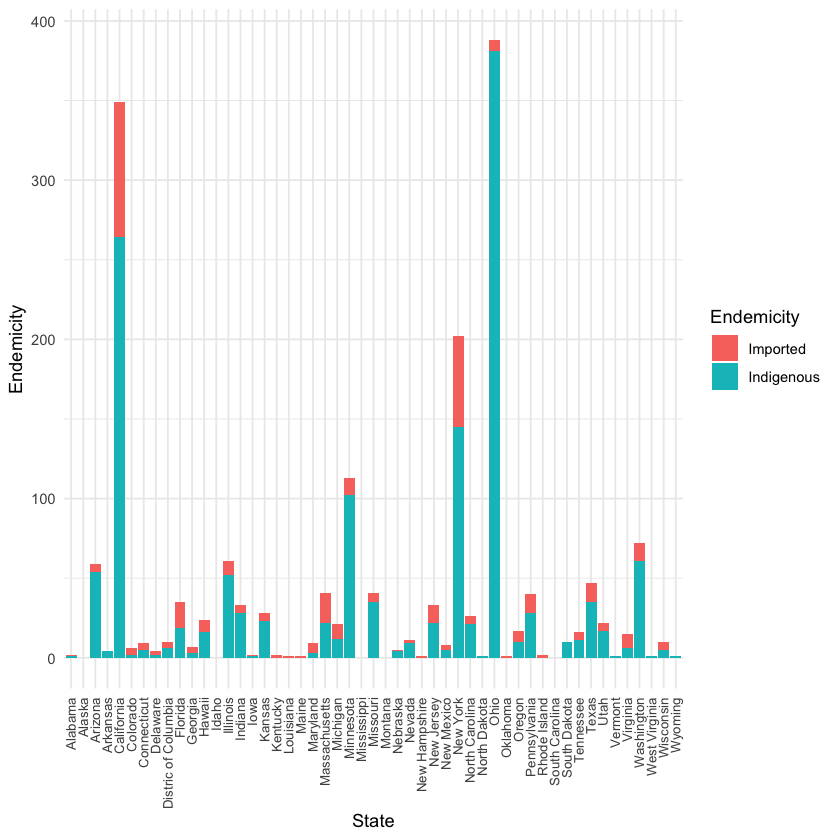

Warning message:
“Ignoring unknown aesthetics: position”

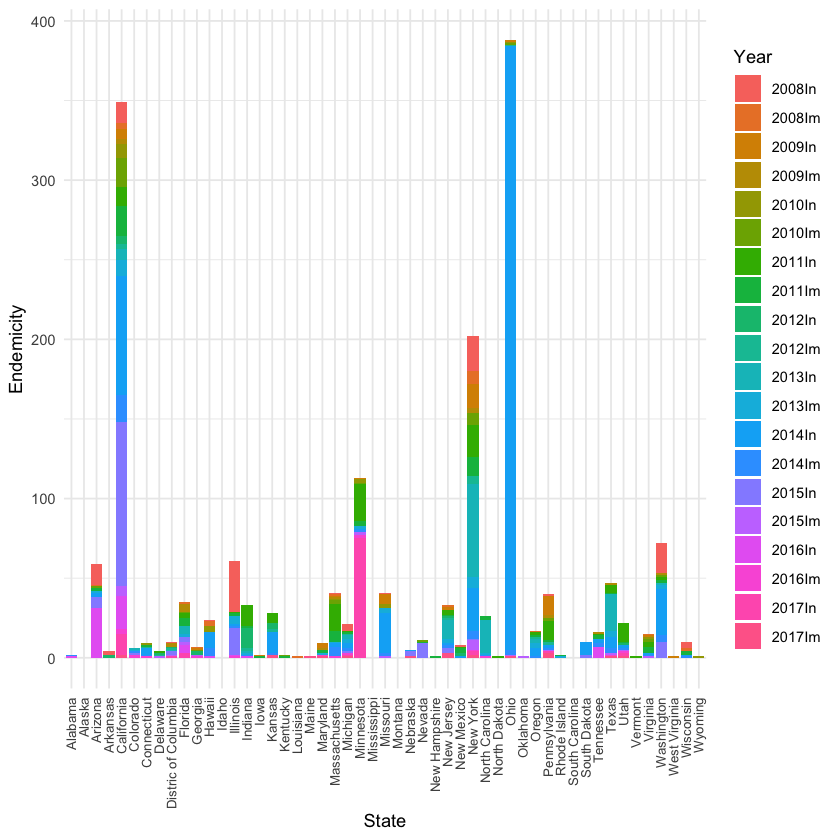

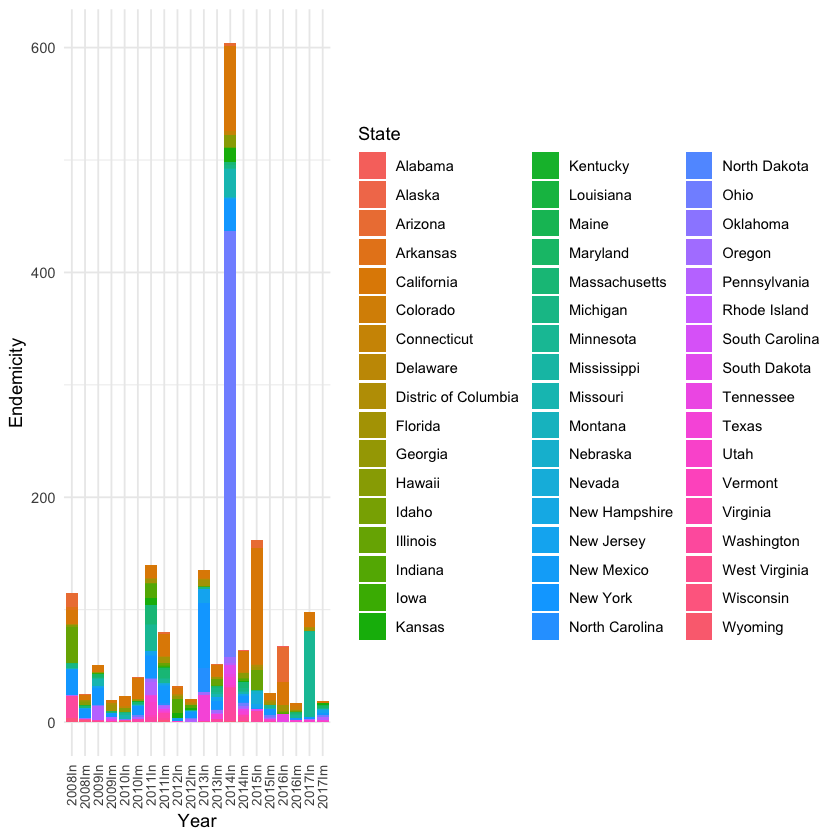

In [152]:
# -- Goal of Cell: Basic plotting of the endemicity data --
# Dependecies:
# Input: {}
# Output: {}

# Load necessary libraries:
library(dplyr)
library(ggplot2)
library(reshape2)
library(stringr)

# Remove total from data frame from because it's confusing
measlesEndemicityByStateClean <- measlesEndemicityByState[measlesEndemicityByState$State != "total",]

# Remove 2018 and source column from data from because it's confusing:
# Note: ncol(data.frame) returns the last column
measlesEndemicityByStateClean <- measlesEndemicityByStateClean[, -c(ncol(measlesEndemicityByStateClean)-1, ncol(measlesEndemicityByStateClean))]

# Mel data frame to make a plotting structure for ggplot2
measlesEndemicityByStateCleanPlot <- melt(measlesEndemicityByStateClean, id.vars = "State")

# Remove NA values
measlesEndemicityByStateCleanPlot <- na.omit(measlesEndemicityByStateCleanPlot)

# Rename column name "variable" to "Year":
colnames(measlesEndemicityByStateCleanPlot)[2] <- "Year"
head(measlesEndemicityByStateCleanPlot, 10)

# Make simplified version of the "Clean" data frame:
measlesEndemicityByStateCleanPlotSimple <- measlesEndemicityByStateCleanPlot
x <- measlesEndemicityByStateCleanPlotSimple %>% # this is the infix operator
    filter(str_detect(Year, "In")) 
x$Year <- "Indigenous"

# Rename the elements in the Year column to "Imported":
y <- measlesEndemicityByStateCleanPlotSimple %>% # infix operator again
    filter(str_detect(Year, "Im"))
y$Year <- "Imported"

# Put it back together:
measlesEndemicityByStateCleanPlotSimple <- rbind(x, y)
colnames(measlesEndemicityByStateCleanPlotSimple)[2] <- "Endemicity"
head(measlesEndemicityByStateCleanPlotSimple, 10)

# Configure the plot/display window
options(repr.plot.width = 7, repr.plot.height = 7)

# Let's visualzie this!
# This is the "simple" Endemicity (Indigenous, Indigenous, ... , Imported) vs. State:
(ggplot(measlesEndemicityByStateCleanPlotSimple) 
  + geom_col(aes(x = State, y = as.numeric(as.character(value)), fill = Endemicity, position = "dodge"))
  + theme_minimal() + labs(color = "Endemicity", x = "State", y = "Endemicity")
  + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 8)))

# Endemicity vs. State:
# This is the "complex" Endemicity (2008In, ... , 2017Im) vs. State:
(ggplot(measlesEndemicityByStateCleanPlot) 
  + geom_col(aes(x = State, y = as.numeric(as.character(value)), fill = Year, position = "dodge"))
  + theme_minimal() + labs(x = "State", y = "Endemicity")
  + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 8)))

# Endemicity vs. State:
# Complex Endemicity vs. Year
(ggplot(measlesEndemicityByStateCleanPlot) 
  + geom_col(aes(x = Year, y = as.numeric(as.character(value)), fill = State, position = "dodge"))
  + theme_minimal() + labs(x = "Year", y = "Endemicity")
  + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 8)))

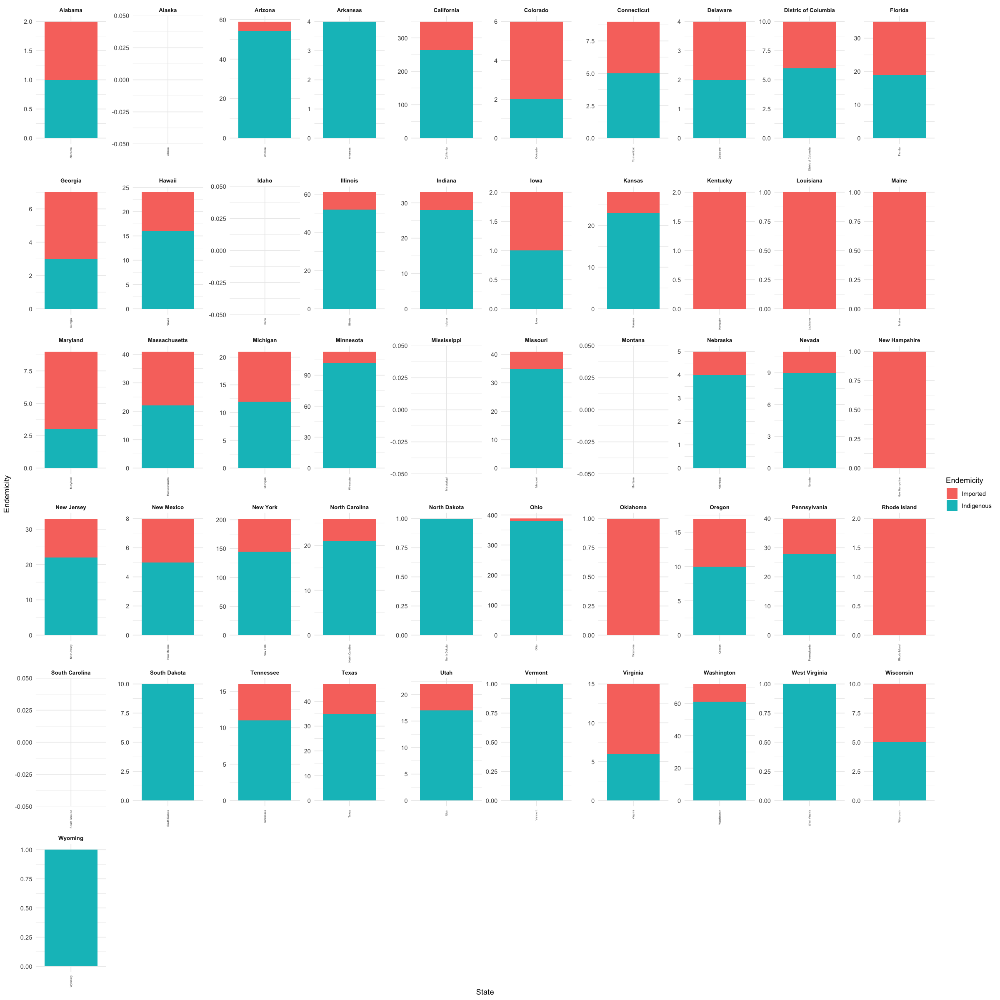

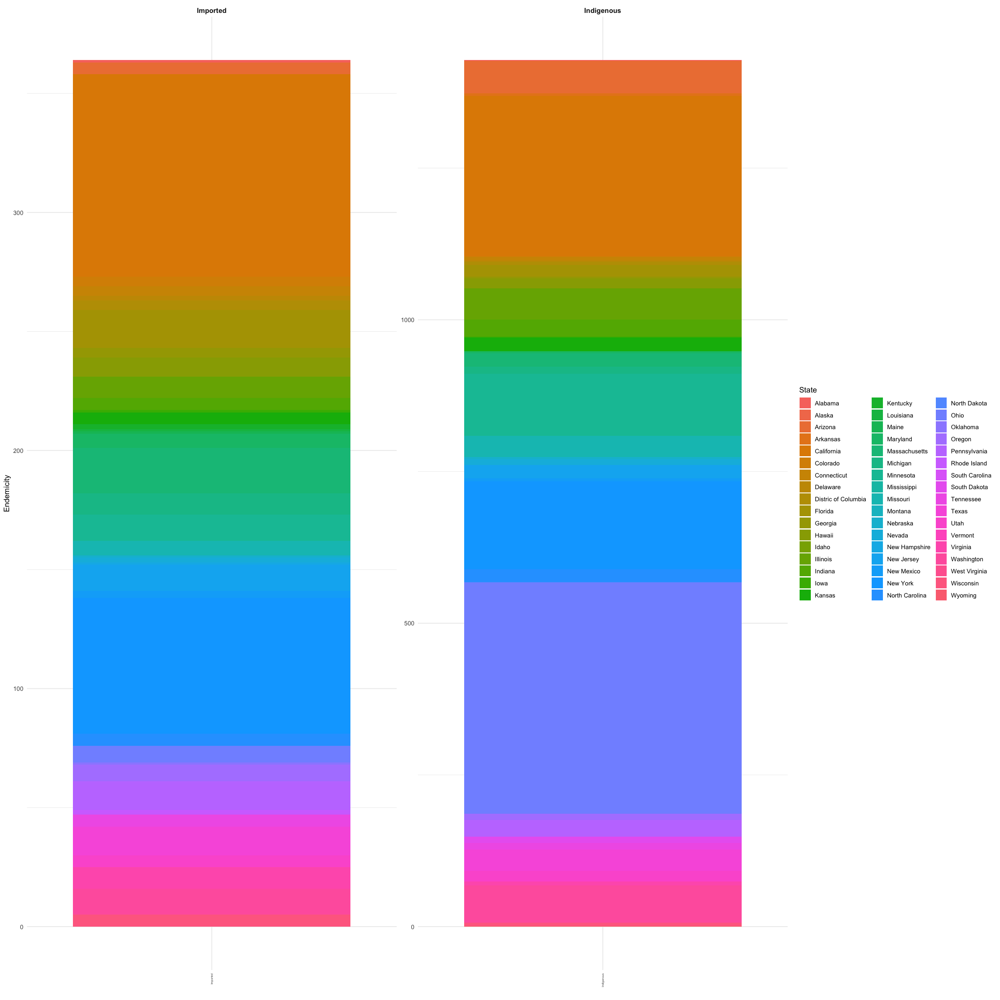

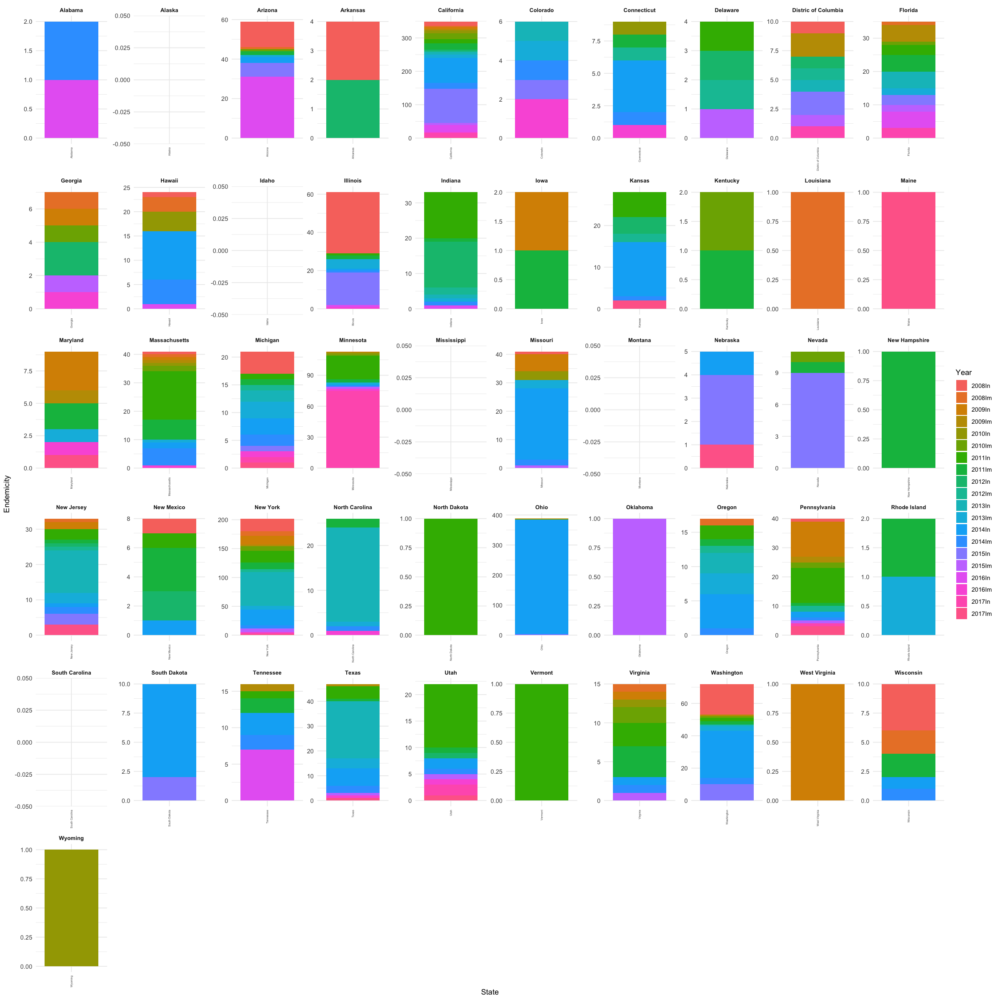

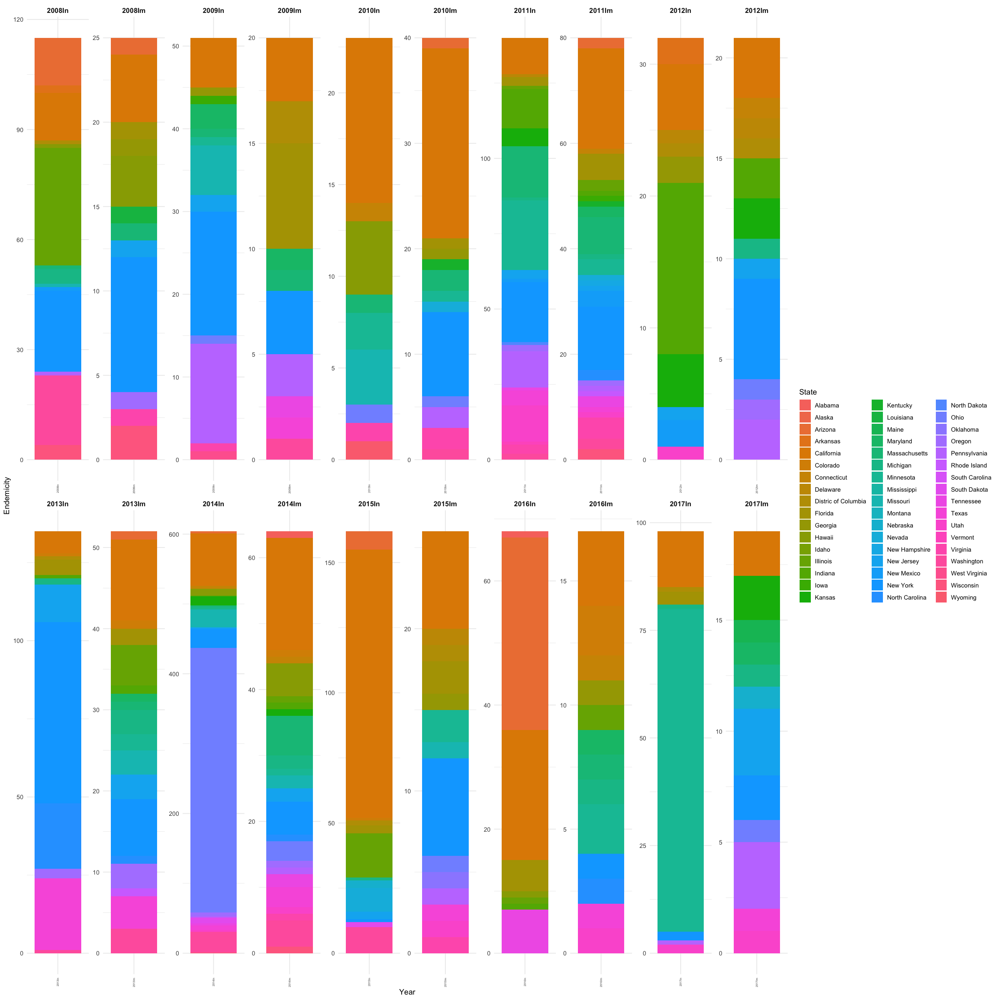

In [166]:
# I want to make a plot with multiple grids:
options(repr.plot.width = 20, repr.plot.height = 20)

(ggplot(measlesEndemicityByStateCleanPlotSimple) 
 + geom_col(aes(x = State, y = as.numeric(as.character(value)), fill = Endemicity))
 + theme_minimal() + labs(x = "State", y = "Endemicity") 
 + facet_wrap(~ State, ncol = 10, scales = "free")
 + theme(strip.text = element_text(face = "bold", size = 8))
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 4))
) 

(ggplot(measlesEndemicityByStateCleanPlotSimple) 
 + geom_col(aes(x = Endemicity, y = as.numeric(as.character(value)), fill = State))
 + theme_minimal() + labs(x = "", y = "Endemicity") 
 + facet_wrap(~ Endemicity, ncol=10, scales = "free")
 + theme(strip.text = element_text(face ="bold", size = 10))
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 4))
) 

(ggplot(measlesEndemicityByStateCleanPlot) 
 + geom_col(aes(x = State, y = as.numeric(as.character(value)), fill = Year))
 + theme_minimal() + labs(x = "State", y = "Endemicity") 
 + facet_wrap(~ State, ncol = 10, scales = "free")
 + theme(strip.text = element_text(face = "bold", size = 8))
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 4))
) 

(ggplot(measlesEndemicityByStateCleanPlot) 
 + geom_col(aes(x = Year, y = as.numeric(as.character(value)), fill = State))
 + theme_minimal() + labs(x = "Year", y = "Endemicity") 
 + facet_wrap(~ Year, ncol=10, scales = "free")
 + theme(strip.text = element_text(face ="bold", size = 10))
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 4))
) 

Warning message:
“Removed 733 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”

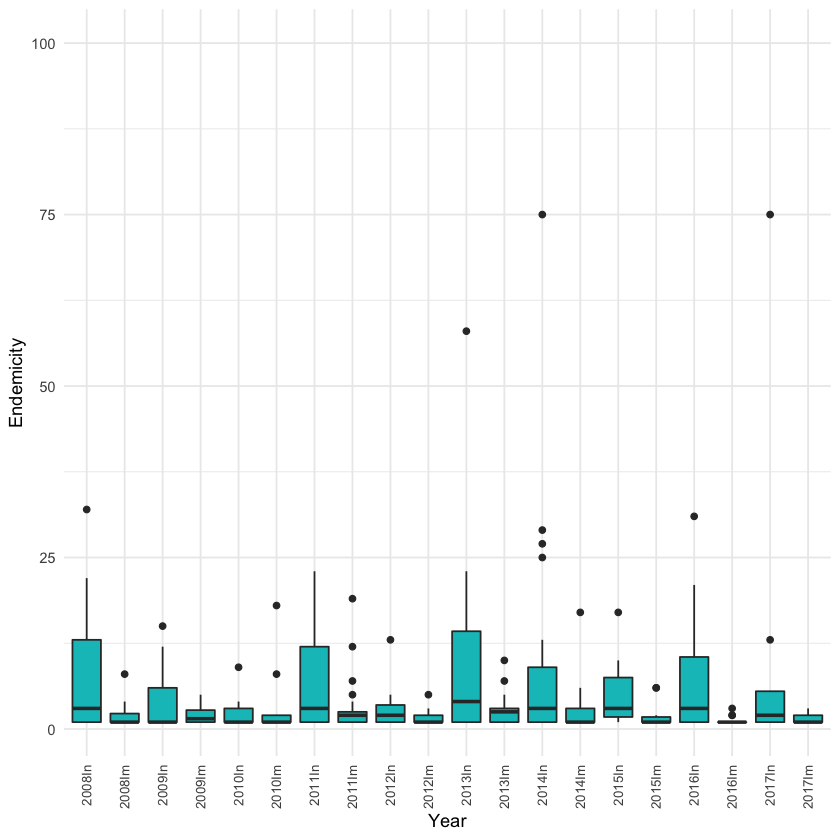

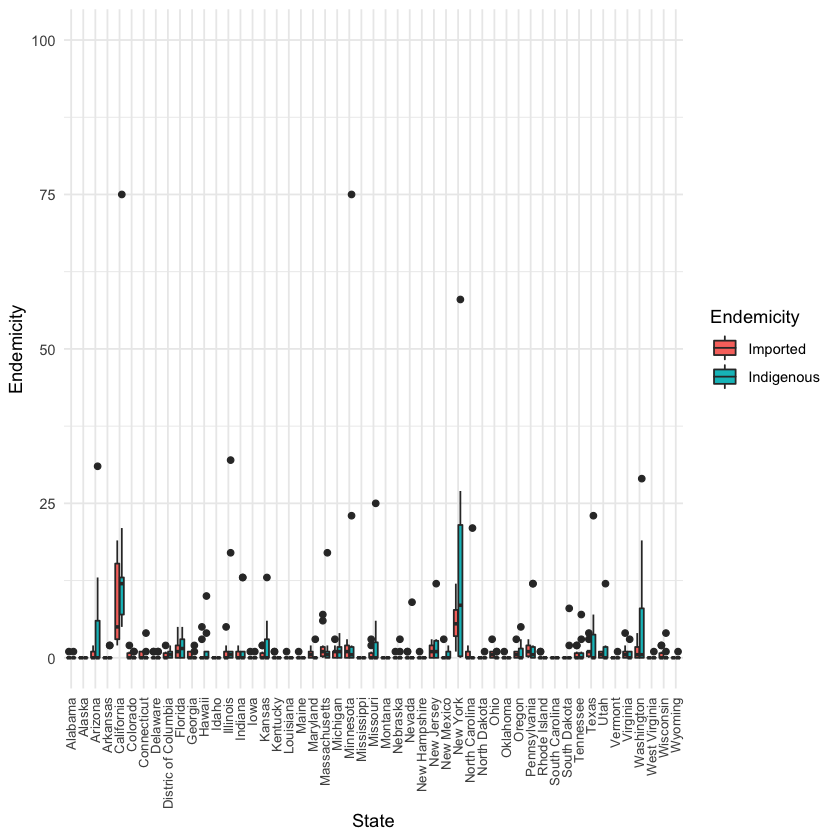

In [161]:
# Generate boxplot for Endemicity vs. Year: 
options(repr.plot.width = 7, repr.plot.height = 7)

(ggplot(measlesEndemicityByStateCleanPlot, aes(x = Year, y = as.numeric(as.character(value)))) 
 + theme_minimal() + labs(x = "Year", y = "Endemicity") 
 + geom_boxplot(fill = "#00C0C3") + ylim(1,100) # Remove outliers... 
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 8))) 

# Generate boxplot for Endemicity vs. State: 
(ggplot(measlesEndemicityByStateCleanPlotSimple, aes(x = State, y = as.numeric(as.character(value)), fill = Endemicity)) 
 + theme_minimal() + labs(x = "State", y = "Endemicity") 
 + geom_boxplot() + ylim(0,100) # Remove outliers...  
 + theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 8))) 

## 1.3.3 Exploratory Graphing: Creating more Clarity

###### 2. Sentiment Analysis

In [ ]:
library(ggplot2)
library(grid)
library(gridExtra)
library(reshape2)
library(syuzhet)

# Let's create a similar structure like the one pattern.nlp uses
polarity.df <- function(sentences,method){
    syuzhet_vector <- get_sentiment(sentences, method=method,) # Get the polarity of each sentences  
    pol_mtrx <- matrix(nr=length(sentences), nc=2) # create a similar structure like the one pattern.nlp uses
    col1_name <- paste("polarity", "(method:", sprintf("%s)", method), sep=" ") # get the name of the sentiment method
    colnames(pol_mtrx) <- c(col1_name, 'id')
    for(i in seq_along(sentences)){	
        pol <- syuzhet_vector[i]
        rm_space <- gsub("\\s+"," ",sentences[i]) # remove unnessary spacing
        id <- tolower(rm_space) # switch to lowercase
        pol_mtrx[i,] <- c(pol, id)
    }
    pol.df <- as.data.frame(pol_mtrx) # this is only really useful for using ggplot2(only works with data.frames)
}

measlesNoRT <- twListToDF(searchTwitter("#measles -filter:retweets", n = 5))

# Default sentiment method is syuzhet
syuz <- polarity.df(measlesNoRT$text,"syuzhet")

# Take a look at the result
syuz

# Try sentiment method nrc
nrc <- polarity.df(measlesNoRT$text,"nrc")

# Take a look at the result
nrc

# Try sentiment method bing
bing <- polarity.df(measlesNoRT$text,"bing")

# Take a look at the result
bing

# Try sentiment method afinn
afinn <- polarity.df(measlesNoRT$text,"afinn")

# Take a look at the result
afinn

### Digital Epidemiology : Introduction to Sentiment Analysis -- Ex.

In [1]:
library(findpython)
can_find_python_cmd(required_modules = "pattern.db")

[1] TRUE
attr(,"python_cmd")
[1] "/usr/bin/python2.7"

In [2]:
# devtools::install_github("bnosac/pattern.nlp", INSTALL_opts = "--no-multiarch")
require(devtools)
install_bitbucket("Floooo/PythonInR")

Loading required package: devtools



✔  checking for file ‘/private/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T/RtmpXIxSJV/remotes47026369b9e9/Floooo-pythoninr-3d88749a2d22/DESCRIPTION’ (6.7s)
─  preparing ‘PythonInR’: (22.9s)
✔  checking DESCRIPTION meta-information
─  cleaning src
─  checking for LF line-endings in source and make files and shell scripts (1.5s)
─  checking for empty or unneeded directories
─  building ‘PythonInR_0.1-3.tar.gz’
   


ERROR: Error in i.p(...): (converted from warning) installation of package ‘/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//RtmpXIxSJV/file4702228e6061/PythonInR_0.1-3.tar.gz’ had non-zero exit status


In [7]:

install.packages("PythonEmbedInR", repos=c("http://cran.fhcrc.org", "http://ran.synapse.org"))


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//RtmpogCa2N/downloaded_packages


In [14]:
# install.packages("findpython")
library(findpython)
can_find_python_cmd(required_modules = "pattern.db")
devtools::install_github("bnosac/pattern.nlp", INSTALL_opts = "--no-multiarch")
# library(pattern.nlp)

[1] TRUE
attr(,"python_cmd")
[1] "/usr/bin/python2.7"

PythonInR (NA -> 0.1-6) [CRAN]


Installing 1 packages: PythonInR



  There is a binary version available but the source version is later:
          binary source needs_compilation
PythonInR  0.1-4  0.1-6              TRUE



installing the source package ‘PythonInR’



ERROR: Error in i.p(...): (converted from warning) installation of package ‘PythonInR’ had non-zero exit status


In [1]:
# Load necessary libraries for plotting and shaping
library(ggplot2)
library(grid)
library(gridExtra)
library(reshape2)
library(tibble)
 
# Load necessary libraries for pattern
library(pattern.nlp)

# Load necessary libaries for syuzhet
library(syuzhet)

# Load necessary libaries for sentimentR
library(sentimentr)

# measlesNoRT <- twListToDF(searchTwitter("#measles -filter:retweets", n = 5))

# Generate a sentence to compare:
sentence <- "The movie attempts to be surreal by incorporating various time  paradoxes, but it's presented in such a ridiculous way it's seriously boring."

# Run pattern over sentence
pattern.Rating <- pattern_sentiment(sentence, language = 'english')

# Run sentimentr over sentence
sentimentr.Rating <- sentiment(sentence,lexicon::hash_sentiment_huliu)

# Let's create a similar structure like the one pattern.nlp uses:
polarity.df <- function(sentences,method){
    syuzhet_vector <- get_sentiment(sentences, method=method,) # Get the polarity of each sentences  
    pol_mtrx <- matrix(nr=length(sentences), nc=2) # create a similar structure like the one pattern.nlp uses
    col1_name <- paste("polarity", "(method:", sprintf("%s)", method), sep=" ") # get the name of the sentiment method
    colnames(pol_mtrx) <- c(col1_name, 'id')
    for(i in seq_along(sentences)){	
        pol <- syuzhet_vector[i]
        rm_space <- gsub("\\s+"," ",sentences[i]) # remove unnessary spacing
        id <- tolower(rm_space) # switch to lowercase
        pol_mtrx[i,] <- c(pol, id)
    }
    pol.df <- as.data.frame(pol_mtrx) # this is only really useful for using ggplot2(only works with data.frames)
}

# Run syuzhet on sentence:
# Default sentiment method is syuzhet
syuz <- polarity.df(sentence,"syuzhet")

# Take a look at the result
syuz

# Try sentiment method nrc
nrc <- polarity.df(sentence,"nrc")

# Take a look at the result
nrc

# Try sentiment method bing
bing <- polarity.df(sentence,"bing")

# Take a look at the result
bing

# Try sentiment method afinn
afinn <- polarity.df(sentence,"afinn")

# Take a look at the result
afinn

ERROR: Error in library(pattern.nlp): there is no package called ‘pattern.nlp’


# 3. Machine Learning with R: A Tutorial on Building Text Classifiers

In [ ]:
# installing necessary packages:
install.packages("kernlab")
install.packages("caret")
install.packages("tm")
install.packages("dplyr")
install.packages("splitstackshape")
install.packages("e1071")

In [ ]:
# Load necessary packages
library(kernlab) 
library(caret) 
library(tm) 
library(dplyr) 
library(splitstackshape)
library(e1071)

In [ ]:
# Step 1. Ingest training data and clean it.
train <- VCorpus(DirSource("Training", encoding = "UTF-8"), readerControl=list(language="English"))
train <- tm_map(train, content_transformer(stripWhitespace))
train <- tm_map(train, content_transformer(tolower))
train <- tm_map(train, content_transformer(removeNumbers))
train <- tm_map(train, content_transformer(removePunctuation))

In [ ]:
# Step 2. Create document term matrices for the training data.
train.dtm <- as.matrix(DocumentTermMatrix(train, control=list(wordLengths=c(1,Inf))))

In [ ]:
head(train.dtm,10)

In [ ]:
# Step 3. Ingest testing data and clean it.
test <- VCorpus(DirSource("Test", encoding = "UTF-8"), readerControl=list(language="English"))
test <- tm_map(test, content_transformer(stripWhitespace))
test <- tm_map(test, content_transformer(tolower))
test <- tm_map(test, content_transformer(removeNumbers))
test <- tm_map(test, content_transformer(removePunctuation))
test.dtm <- as.matrix(DocumentTermMatrix(test, control=list(wordLengths=c(1,Inf))))

In [ ]:
head(test.dtm,10)

In [ ]:
# Step 4. Make test and train matrices of identical length (find intersection)
train.df <- data.frame(train.dtm[,intersect(colnames(train.dtm), colnames(test.dtm))])
test.df <- data.frame(test.dtm[,intersect(colnames(test.dtm), colnames(train.dtm))])

In [ ]:
head(train.df)
head(test.df)

In [ ]:
# Step 5. Retrieve the correct labels for training data and put dummy values for testing data
label.df <- data.frame(row.names(train.df))
colnames(label.df) <- c("filenames")
label.df<- cSplit(label.df, 'filenames', sep="_", type.convert=FALSE)
train.df$corpus<- label.df$filenames_1
test.df$corpus <- c("Neg")

In [ ]:
# Step 6. Create folds of your data, then run the training once to inspect results
df.train <- train.df
df.test <- train.df
df.model <- ksvm(corpus~., data= df.train, kernel="rbfdot")
df.pred <- predict(df.model, df.test)

In [ ]:
con.matrix <- confusionMatrix(table(df.pred, df.test$corpus))
print(con.matrix)

In [ ]:
# Step 7. Run the final prediction on the test data and re-attach file names.
df.test <- test.df
df.pred <- predict(df.model, df.test)
results <- as.data.frame(df.pred)
rownames(results) <- rownames(test.df)
print(results)

In [ ]:
setwd('/Users/erickoduniyi/Desktop/twitter-notebook/CDC-data')
dir()

In [ ]:
df <- read_excel('')

In [ ]:
library(readtext)
df <- readtext('2018-01-table1.txt')
df2 <- read.table('2018-01-table1.txt',header=FALSE)
df2

## 3.1 Machine Learning with R: Measles Example

# 4. Twitter Streaming API 

In [111]:
install.packages("streamR")
install.packages("ROAuth")


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages

The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


In [112]:
# Install and load neccesary libraries
# install.packages('streamR')
# install.packages('ROAuth')
library(streamR)
library(ROAuth)

# Setting up API keys and authenticated request
requestURL <- "https://api.twitter.com/oauth/request_token"
accessURL <- "https://api.twitter.com/oauth/access_token"
authURL <- "https://api.twitter.com/oauth/authorize"
consumerKey <- "o82CIPB0SHTbn1vxJn2SUG0YJ"
consumerSecret <- "xv7aYTCH9Ks05MHB0NujvYEyy1eNr2X2jyIjwilAwPZxzNEIuD"
accessToken <- "1044689406874005504-BttOGUgC8iJeTwhGCRcWlJbaDSE9sV"
accessTokenSecret <- "8xy7k4god2LpbjvabQs2wDcNgI1ICuyi6jF6mtccO41ka"

# Setting up Twitter connection without handshake
my_oauth <- list(consumer_key = consumerKey, consumer_secret = consumerSecret, access_token = accessToken, access_token_secret = accessTokenSecret)

In [113]:
# Notes: How long should we be streaming? Or should we specificy a number of tweets

# Stream Twitter data from a specific location
# Collect tweets over the U.S
filterStream(file.name = 'measles_USA.json', # we can change formats
             timeout = 60,  # we can add more time, 600?
             #tweets = 10, # here we add a constrain by number of twits
             oauth = my_oauth, # authorization token, this one without handshake
             location = c(-125, 25, -66, 50), # definition of bouncing box, aproximate US...is better to put more geo area to eliminate later
             track = c("measles, #vaccinesfreedom, vaccines, consent")) # track keywords in realtime

# # Collect tweets over Arizona
# filterStream(file.name = 'measles_AZ.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-114.8,31.3,-109,37), # Arizona bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over California
# filterStream(file.name = 'measles_CA.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-124.5,32.5,-114.1,42), # California bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Florida
# filterStream(file.name = 'measles_FL.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-87.6,24.4,-80,31), # Florida bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Kansas
# filterStream(file.name = 'measles_KS.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-102,37,-94.5,40), # Kansas bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Michigan
# filterStream(file.name = 'measles_MI.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-90.4,41.7,-82.1,48.3), # Michigan bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over New York
# filterStream(file.name = 'measles_NY.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-74.3,40.5,-73.7,41), # New York bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over New Jersey
# filterStream(file.name = 'measles_NJ.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-75.6,38.8,-73.9,41.4), # New Jersey bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Ohio
# filterStream(file.name = 'measles_OH.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-84.8,38.4,-80.5,42.3), # Ohio bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Tennesse
# filterStream(file.name = 'measles_TN.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-90.3,35,-81.6,36.7), # Tennesse bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Texas
# filterStream(file.name = 'measles_TX.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-106.6,25.8,-93.5,36.5), # Texas bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# # Collect tweets over Washington
# filterStream(file.name = 'measles_WA.json',
#              timeout = 60, oauth = my_oauth,
#              location = c(-124.8,45.5,-117,49), # Washington bounding box
#              track = c("measles, #vaccinesfreedom, vaccines, consent")) 

# Parse tweets
measlesTweetsUSA <- parseTweets(tweets = 'measles_USA.json')
# measlesTweetsAZ <- parseTweets(tweets = 'measles_AZ.json')
# measlesTweetsCA <- parseTweets(tweets = 'measles_CA.json')
# measlesTweetsFL <- parseTweets(tweets = 'measles_FL.json')
# measlesTweetsKS <- parseTweets(tweets = 'measles_KS.json')
# measlesTweetsMI <- parseTweets(tweets = 'measles_MI.json')
# measlesTweetsNY <- parseTweets(tweets = 'measles_NY.json')
# measlesTweetsNJ <- parseTweets(tweets = 'measles_NJ.json')
# measlesTweetsOH <- parseTweets(tweets = 'measles_OH.json')
# measlesTweetsTN <- parseTweets(tweets = 'measles_TN.json')
# measlesTweetsTX <- parseTweets(tweets = 'measles_TX.json')
# measlesTweetsWA <- parseTweets(tweets = 'measles_WA.json')

# # Export tweets
# write.csv(measlesTweetsUSA, file = 'measlesTweetsUSA.csv')
# write.csv(measlesTweetsAZ, file = 'measlesTweetsAZ.csv')
# write.csv(measlesTweetsCA, file = 'measlesTweetsCA.csv')
# write.csv(measlesTweetsFL, file = 'measlesTweetsFL.csv')
# write.csv(measlesTweetsKS, file = 'measlesTweetsKS.csv')
# write.csv(measlesTweetsAZ, file = 'measlesTweetsAZ.csv')
# write.csv(measlesTweetsMI, file = 'measlesTweetsMI.csv')
# write.csv(measlesTweetsNY, file = 'measlesTweetsNY.csv')
# write.csv(measlesTweetsNJ, file = 'measlesTweetsNJ.csv')
# write.csv(measlesTweetsOH, file = 'measlesTweetsOH.csv')
# write.csv(measlesTweetsTN, file = 'measlesTweetsTN.csv')
# write.csv(measlesTweetsTX, file = 'measlesTweetsTX.csv')
# write.csv(measlesTweetsWA, file = 'measlesTweetsWA.csv')

Capturing tweets...
Connection to Twitter stream was closed after 60 seconds with up to 1421 tweets downloaded.
5587 tweets have been parsed.


## 4.1 Making maps: Streaming Data

## 4.2 Making maps: Measle Cases

## 4.3 Making maps: Endemicity

In [115]:
install.packages("maps")


The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//Rtmp360tCZ/downloaded_packages


In [ ]:
measlesTweetsTN <- parseTweets(tweets = 'measles_TN.json')

In [116]:
# Make sure I have the maps packages
# install.packages('maps')
library(maps)
library(ggplot2)

# Collect tweets with geographical information
measlesTweetsUSA$lat <- ifelse(is.na(measlesTweetsUSA$lat), measlesTweetsUSA$place_lat, measlesTweetsUSA$lat)
measlesTweetsUSA$lon <- ifelse(is.na(measlesTweetsUSA$lon), measlesTweetsUSA$place_lon, measlesTweetsUSA$lon)
states <- map.where("state", na.omit(measlesTweetsUSA$lon), na.omit(measlesTweetsUSA$lat))

# Take a number of tweets per state
# sort(table(statesClean), decreasing=TRUE)


Attaching package: ‘maps’

The following object is masked from ‘package:purrr’:

    map



Warning message:
“Removed 336 rows containing missing values (geom_point).”

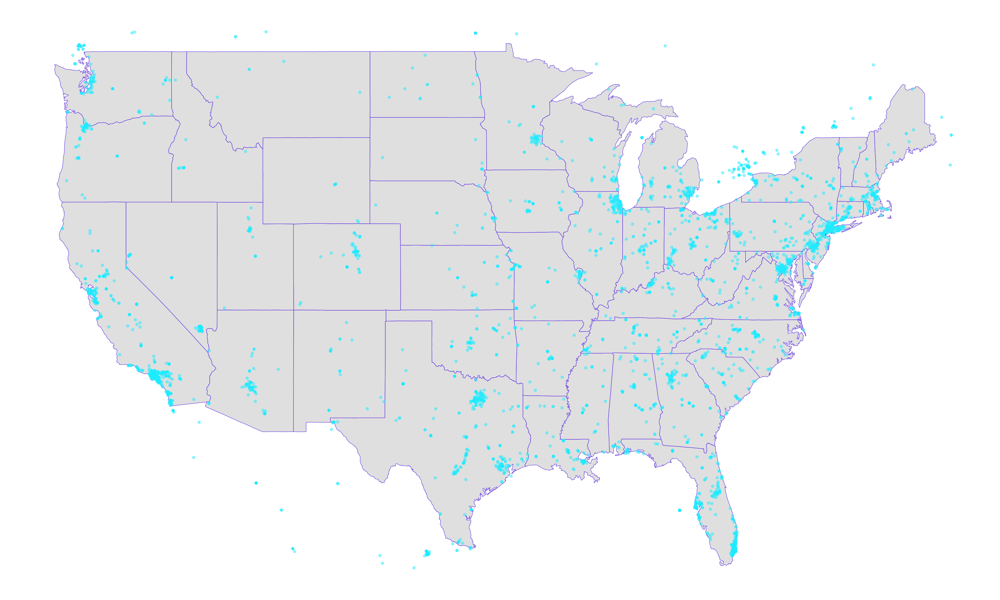

In [117]:
# Prepare a map with the exact geographical locations of the tweets
map.data <- map_data("state")
options(repr.plot.width=25, repr.plot.height=15)
ggplot(map.data) + geom_map(aes(map_id = region), map = map.data, fill = "grey90", 
    color = "#4C0CE8", size = 0.25) + expand_limits(x = map.data$long, y = map.data$lat) + 
    scale_x_continuous(limits=c(-125,-66)) + scale_y_continuous(limits=c(25,50)) +
    geom_point(data = measlesTweetsUSA, 
    aes(x = lon, y = lat), size = 2, alpha = .5, color = "#07EEFF") +
    theme(axis.line = element_blank(), 
        axis.text = element_blank(), 
        axis.ticks = element_blank(), 
        axis.title = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(), 
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank(), 
        plot.background = element_blank())

In [3]:
# For testing purposes let's save the original AZ file
measlesTweetsAZtemp <- measlesTweetsAZ

# Collect tweets with geographical information
measlesTweetsAZ$lat <- ifelse(is.na(measlesTweetsAZ$lat), measlesTweetsAZ$place_lat, measlesTweetsAZ$lat)
measlesTweetsAZ$lon <- ifelse(is.na(measlesTweetsAZ$lon), measlesTweetsAZ$place_lon, measlesTweetsAZ$lon)
AZcoordinates <- map.where("state", na.omit(measlesTweetsAZ$lon), na.omit(measlesTweetsAZ$lat))

# Take a number of tweets per state
sort(table(AZcoordinates), decreasing=TRUE)

ERROR: Error in eval(expr, envir, enclos): object 'measlesTweetsAZ' not found


In [ ]:
# Prepare a map with the exact geographical locations of the tweets
map.data <- map_data("state")
options(repr.plot.width=25, repr.plot.height=15)
ggplot(map.data) + geom_map(aes(map_id = region), map = map.data, fill = "grey90", 
    color = "#4C0CE8", size = 0.25) + expand_limits(x = map.data$long, y = map.data$lat) + 
    scale_x_continuous(limits=c(-125,-66)) + scale_y_continuous(limits=c(25,50)) +
    geom_point(data = measlesTweetsAZ, 
    aes(x = lon, y = lat), size = 2, alpha = .5, color = "#07EEFF") +
    theme(axis.line = element_blank(), 
        axis.text = element_blank(), 
        axis.ticks = element_blank(), 
        axis.title = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(), 
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank(), 
        plot.background = element_blank())

In [ ]:
library(readxl)
df <- read.csv("dataView2116_172.csv",header = T, fileEncoding = "utf8")
head(df)

# NISPUF12.R

So, Maddie uploaded an R file called NISPUF17.R, which apprently creates a permanent R dataset from the 2017 nis-child public-use ascii file. So, I'm now going to go through this program to see what type of data we can collect for this thing.

In [2]:
install.packages("Hmisc")

also installing the dependencies ‘checkmate’, ‘htmlwidgets’, ‘Formula’, ‘latticeExtra’, ‘acepack’, ‘gridExtra’, ‘htmlTable’, ‘viridis’




The downloaded binary packages are in
	/var/folders/bg/wxdnd22s695f4569t0v1v2x80000gn/T//RtmpiGX2Qo/downloaded_packages


In [1]:
# Step 1.
# What is the HMisc library used for?
library(Hmisc) 

PUF <- getwd()
flatfile <- paste(PUF,'/','NISPUF17.DAT',sep='')

Loading required package: lattice
Loading required package: survival
Loading required package: Formula
Loading required package: ggplot2

Attaching package: ‘Hmisc’

The following objects are masked from ‘package:base’:

    format.pval, units



In [5]:
# Step 2.
AGEGRPlevels=c(1,2,3)
AGEGRPlabels=c("19 - 23 MONTHS", "24 - 29 MONTHS", "30 - 35 MONTHS")

LANGUAGElevels=c(1,2,3)
LANGUAGElabels=c("ENGLISH", "SPANISH", "OTHER")

YNDKRFlevels=c(1,2,77,99)
YNDKRFlabels=c("YES", "NO", "DON'T KNOW", "REFUSED")

SHOTCOUNlevels=c(77,88,99)
SHOTCOUNlabels=c("DON'T KNOW", "1+ BUT UNKNOWN NUMBER", "REFUSED")

YNlevels=c(1,2)
YNlabels=c("YES", "NO")

Ylevels=c(1)
Ylabels=c("YES")

CHILDNMlevels=c(1,2,3,77,99)
CHILDNMlabels=c("ONE", "TWO OR THREE", "FOUR OR MORE", "DON'T KNOW", "REFUSED")

CWIClevels=c(1,2,3,77,99)
CWIClabels=c("YES", "NO", "NEVER HEARD OF WIC", "DON'T KNOW", "REFUSED")

EDUC1_levels=c(1,2,3,4,77,99)
EDUC1_labels=c("< 12 YEARS", "12 YEARS", "> 12 YEARS, NON-COLLEGE GRAD", "COLLEGE GRAD", "DON'T KNOW", "REFUSED")

HISPlevels=c(1,2,3,4,5)
HISPlabels=c("HISPANIC", "NON-HISPANIC", "OTHER", "DON'T KNOW", "REFUSED")

MOBILlevels=c(1,2,77,99)
MOBILlabels=c("MOVED FROM DIFFERENT STATE", "DID NOT MOVE FROM DIFFERENT STATE", "DON'T KNOW", "REFUSED")

SEXlevels=c(1,2,77,99)
SEXlabels=c("MALE", "FEMALE", "DON'T KNOW", "REFUSED")

INCPOVlevels=c(1,2,3,4)
INCPOVlabels=c("ABOVE POVERTY, > $75K", "ABOVE POVERTY, <= $75K", "BELOW POVERTY", "UNKNOWN")

HASPDA2Flevels=c(1,2)
HASPDA2Flabels=c("CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS", "CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA")

PROVIDlevels=c(1,2,3,4,5,6,7)
PROVIDlabels=c("ALL PUBLIC FACILITIES", "ALL HOSPITAL FACILITIES", "ALL PRIVATE FACILITIES", "ALL MILITARY/OTHER FACILITIES", "MIXED", "TYPE OF PROVIDER UNKNOWN", "ALL WIC CLINIC PROVIDERS")

REGISTRYlevels=c(1,2,3,4)
REGISTRYlabels=c("ALL PROVIDERS", "SOME BUT POSSIBLY OR DEFINITELY NOT ALL PROVIDERS", "NO PROVIDERS", "UNKNOWN/DON'T KNOW")

TYPElevels=c("","01","02","03","04","05","07","08","1L","1M","1N","20","21","22","30","31","32","33","43","44","60","70","71","72","73","74","BC","D3","DH","DK","FL","FM","FN","FO","H2","HA","HB","HG","HI","HM","HS","HY","MA","MB","MM","MP","NC","OT","RB",
"RG","RM","RO","TY","UN","VA","VM","VO","YF")
TYPElabels=c("MISSING", "DT", "DTP", "DTP-UNKNOWN", "DTAP", "DTP-HIB", "DTAP-HIB", "DTAP-HEPB-IPV", "H1N1 FLU-UNKNOWN", "H1N1 FLU SPRAY", "H1N1 FLU INJECTED", "OPV", "IPV", "POLIO-UNKNOWN", "MMR", "MEASLES ONLY", "MEASLES-MUMPS", "MEASLES-RUBELLA",
"HEPB-HIB", "HIB ONLY-UNKNOWN", "HEPB ONLY", "PCV CONJUGATE-UNKNOWN", "PCV POLYSACCHARIDE", "PCV-UNKNOWN", "PCV CONJUGATE-7", "PCV CONJUGATE-13", "BCG (TUBERCULOSIS)", "DTAP-IPV-HIB", "DTP-HEPB", "DON'T KNOW", "SEASONAL FLU-UNKNOWN", "SEASONAL FLU SPRAY",
"SEASONAL FLU INJECTED", "FOUR-IN-ONE", "HIB (SANOFI OR GLAXOSMITHKLINE)", "HEPA", "HEPB-UNKNOWN", "HIB (GLAXOSMITHKLINE)", "HIB-UNKNOWN", "HIB (MERCK)", "HIB (SANOFI)", "HIB-MENCY", "MALARIA", "MUMPS-RUBELLA", "MCV-UNKNOWN", "MUMPS", "NEVER CODABLE",
"OTHER", "RUBELLA", "ROTARIX (GSK)", "ROTATEQ (MERCK)", "ROTAVIRUS-UNKNOWN", "TYPHOID", "UNCODABLE", "VARICELLA-UNKNOWN", "MMR-VARICELLA", "VARICELLA-ONLY", "YELLOW FEVER")

HEPBRTlevels=c(1,2)
HEPBRTlabels=c("AT LEAST ONE PROVIDER CHECKED GIVEN AT BIRTH", "NO PROVIDERS CHECKED GIVEN AT BIRTH")

HEPFLGlevels=c(1,2)
HEPFLGlabels=c("HEPB BIRTH SHOT DATE IMPUTED FROM SHOTCARD", "HEPB BIRTH SHOT DATE IMPUTED FROM DISTRIBUTION OF BIRTH DOSE DATES")

UTDlevels=c(0,1)
UTDlabels=c("NOT UTD", "UTD")

CENREGlevels=c(1,2,3,4)
CENREGlabels=c("NORTHEAST", "MIDWEST", "SOUTH", "WEST")

STATElevels=c(1,10,11,12,13,15,16,17,18,19,2,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,4,40,41,42,44,45,46,47,48,49,5,50,51,53,54,55,56,6,66,72,78,8,9)
STATElabels=c("ALABAMA", "DELAWARE", "DISTRICT OF COLUMBIA", "FLORIDA", "GEORGIA", "HAWAII", "IDAHO", "ILLINOIS", "INDIANA", "IOWA", "ALASKA", "KANSAS", "KENTUCKY", "LOUISIANA", "MAINE", "MARYLAND", "MASSACHUSETTS", "MICHIGAN", "MINNESOTA", "MISSISSIPPI",
"MISSOURI", "MONTANA", "NEBRASKA", "NEVADA", "NEW HAMPSHIRE", "NEW JERSEY", "NEW MEXICO", "NEW YORK", "NORTH CAROLINA", "NORTH DAKOTA", "OHIO", "ARIZONA", "OKLAHOMA", "OREGON", "PENNSYLVANIA", "RHODE ISLAND", "SOUTH CAROLINA", "SOUTH DAKOTA", "TENNESSEE",
"TEXAS", "UTAH", "ARKANSAS", "VERMONT", "VIRGINIA", "WASHINGTON", "WEST VIRGINIA", "WISCONSIN", "WYOMING", "CALIFORNIA", "GUAM", "PUERTO RICO", "U.S. VIRGIN ISLANDS", "COLORADO", "CONNECTICUT")

RACE_PUFlevels=c(1,2,3)
RACE_PUFlabels=c("WHITE ONLY", "BLACK ONLY", "OTHER + MULTIPLE RACE")

AGECPOXRlevels=c(1,2,3,4)
AGECPOXRlabels=c("0 TO 6 MONTHS OLD", "7 TO 12 MONTHS OLD", "13 TO 18 MONTHS OLD", "19+ MONTHS OLD")

C1Rlevels=c(1,2,3,4,5,6,7,8)
C1Rlabels=c("1", "2", "3", "4", "5", "6", "7", "8+")

C5Rlevels=c(1,2,3,4,77,99)
C5Rlabels=c("MOTHER (STEP, FOSTER, ADOPTIVE) OR FEMALE GUARDIAN", "FATHER (STEP, FOSTER, ADOPTIVE) OR MALE GUARDIAN", "GRANDPARENT", "OTHER FAMILY MEMBER/FRIEND", "DON'T KNOW", "REFUSED")

INCQ298Alevels=c(10,11,12,13,14,3,4,5,6,7,77,8,9,99)
INCQ298Alabels=c("$35001 - $40000", "$40001 - $50000", "$50001 - $60000", "$60001 - $75000", "$75001+", "$0 - $7500", "$7501 - $10000", "$10001 - $17500", "$17501 - $20000", "$20001 - $25000", "DON'T KNOW", "$25001 - $30000", "$30001 - $35000", "REFUSED")

RACEETHKlevels=c(1,2,3,4)
RACEETHKlabels=c("HISPANIC", "NON-HISPANIC WHITE ONLY", "NON-HISPANIC BLACK ONLY", "NON-HISPANIC OTHER + MULTIPLE RACE")

D6Rlevels=c(0,1,2,3)
D6Rlabels=c("0", "1", "2", "3+")

FRSTBRNlevels=c(1,2,77,99)
FRSTBRNlabels=c("NO", "YES", "DON'T KNOW", "REFUSED")

CHARIDlevels=c( )
CHARIDlabels=c("MISSING")

BFFORM08Flevels=c(888)
BFFORM08Flabels=c("NEVER FED FORMULA")

RENTOWNlevels=c(1,2,3,77,99)
RENTOWNlabels=c("OWNED OR BEING BOUGHT", "RENTED", "OTHER ARRANGMENT", "DON'T KNOW", "REFUSED")

NUM_PHONlevels=c(1,2,3,4,77,99)
NUM_PHONlabels=c("ONE", "TWO", "THREE OR MORE", "NONE", "DON'T KNOW", "REFUSED")

MAR_PUF2_levels=c(1,2)
MAR_PUF2_labels=c("MARRIED", "NEVER MARRIED/WIDOWED/DIVORCED/SEPARATED/DECEASED/LIVING WITH PARTNER")

UTDPCVBlevels=c(1,2,3)
UTDPCVBlabels=c("4+ PCV7 PLUS 1+ PCV13", "4+ PCV7, NO FOLLOWING PCV13, WITH TYPE OF ALL VACCINES (IF ANY) FOLLOWING THE 4 PCV7 KNOWN", "ALL OTHERS WITH ADEQUATE PROVIDER DATA")

ESTGRANTlevels=c(1,10,11,12,13,14,16,17,18,19,2,20,22,25,27,28,29,30,31,34,35,36,38,4,40,41,44,46,47,49,5,50,51,54,55,56,57,58,59,6,60,61,62,63,64,65,66,68,7,72,73,74,75,76,77,8)
ESTGRANTlabels=c("CT", "NY-REST OF STATE", "NY-CITY OF NEW YORK", "DC", "DE", "MD", "PA-REST OF STATE", "PA-PHILADELPHIA COUNTY", "VA", "WV", "MA", "AL", "FL", "GA", "KY", "MS", "NC", "SC", "TN", "IL-REST OF STATE", "IL-CITY OF CHICAGO", "IN", "MI", "ME",
"MN", "OH", "WI", "AR", "LA", "NM", "NH", "OK", "TX-REST OF STATE", "TX-CITY OF HOUSTON", "TX-BEXAR COUNTY", "IA", "KS", "MO", "NE", "RI", "CO", "MT", "ND", "SD", "UT", "WY", "AZ", "CA", "VT", "HI", "NV", "AK", "ID", "OR", "WA", "NJ")

INS_BREAK_Ilevels=c(1,2,3,4)
INS_BREAK_Ilabels=c("CURRENTLY INSURED BUT UNINSURED AT SOME POINT SINCE BIRTH", "CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH", "CURRENTLY UNINSURED BUT INSURED AT SOME POINT SINCE BIRTH",
"CURRENTLY UNINSURED AND NEVER INSURED SINCE BIRTH")

MAGEGRP2_levels=c(1,2,77,99)
MAGEGRP2_labels=c("<= 29 YEARS", ">= 30 YEARS", "DON'T KNOW", "REFUSED")

ESTIAP17Flevels=c(1,10,105,106,108,11,12,13,14,16,17,18,19,2,20,22,25,27,28,29,30,31,34,35,36,38,4,40,41,44,46,47,49,5,50,51,52,53,54,55,56,57,58,59,6,60,61,62,63,64,65,66,68,7,72,73,74,75,76,77,8,95)
ESTIAP17Flabels=c("CT", "NY-REST OF STATE", "GUAM", "PUERTO RICO", "TX-TRAVIS COUNTY", "NY-CITY OF NEW YORK", "DC", "DE", "MD", "PA-REST OF STATE", "PA-PHILADELPHIA COUNTY", "VA", "WV", "MA", "AL", "FL", "GA", "KY", "MS", "NC", "SC", "TN",
"IL-REST OF STATE", "IL-CITY OF CHICAGO", "IN", "MI", "ME", "MN", "OH", "WI", "AR", "LA", "NM", "NH", "OK", "TX-REST OF STATE", "TX-DALLAS COUNTY", "TX-EL PASO COUNTY", "TX-CITY OF HOUSTON", "TX-BEXAR COUNTY", "IA", "KS", "MO", "NE", "RI", "CO", "MT",
"ND", "SD", "UT", "WY", "AZ", "CA", "VT", "HI", "NV", "AK", "ID", "OR", "WA", "NJ", "US VIRGIN ISLANDS")

INS_STAT2_Ilevels=c(1,2,3,4)
INS_STAT2_Ilabels=c("PRIVATE INSURANCE ONLY", "ANY MEDICAID", "OTHER INSURANCE", "UNINSURED")

In [6]:
# Step 3.

LIST.NAMEWIDTH <-
c("SEQNUMC",6,
"SEQNUMHH",5,
"PDAT",1,
"PROVWT_D",20,
"RDDWT_D",19,
"STRATUM",4,
"YEAR",4,
"AGECPOXR",1,
"HAD_CPOX",2,
"AGEGRP",1,
"BF_ENDR06",8,
"BF_EXCLR06",8,
"BF_FORMR08",8,
"BFENDFL06",1,
"BFFORMFL06",1,
"C1R",1,
"C5R",2,
"CBF_01",2,
"CEN_REG",1,
"CHILDNM",1,
"CWIC_01",2,
"CWIC_02",2,
"EDUC1",1,
"FRSTBRN",1,
"I_HISP_K",1,
"INCPORAR",16,
"INCPORAR_I",16,
"INCPOV1",1,
"INCQ298A",2,
"LANGUAGE",1,
"M_AGEGRP2",1,
"MARITAL2",1,
"MOBIL_I",1,
"NUM_PHONE",2,
"NUM_CELLS_HH",2,
"NUM_CELLS_PARENTS",2,
"RACE_K",1,
"RACEETHK",1,
"RENT_OWN",2,
"SEX",1,
"ESTIAP17",3,
"EST_GRANT",2,
"STATE",2,
"D6R",1,
"D7",1,
"N_PRVR",1,
"PROV_FAC",1,
"REGISTRY",1,
"VFC_ORDER",1,
"HEP_BRTH",1,
"HEP_FLAG",1,
"P_NUHEPX",1,
"P_NUHIBX",1,
"P_NUHPHB",1,
"P_NUMDAH",1,
"P_NUMDHI",1,
"P_NUMDIH",1,
"P_NUMDTA",1,
"P_NUMDTP",1,
"P_NUMFLU",1,
"P_NUMFLUL",1,
"P_NUMFLUM",1,
"P_NUMFLUN",1,
"P_NUMHEA",1,
"P_NUMHEN",1,
"P_NUMHEP",1,
"P_NUMHG",1,
"P_NUMHHY",1,
"P_NUMHIB",1,
"P_NUMHIN",1,
"P_NUMHION",1,
"P_NUMHM",1,
"P_NUMHS",1,
"P_NUMIPV",1,
"P_NUMMCN",1,
"P_NUMMMR",1,
"P_NUMMMRX",1,
"P_NUMMMX",1,
"P_NUMMP",1,
"P_NUMMPR",1,
"P_NUMMRV",1,
"P_NUMMS",1,
"P_NUMMSM",1,
"P_NUMMSR",1,
"P_NUMOLN",1,
"P_NUMOPV",1,
"P_NUMPCV",1,
"P_NUMPCP",1,
"P_NUMPCC",1,
"P_NUMPCC7",1,
"P_NUMPCC13",1,
"P_NUMPCCN",1,
"P_NUMPCN",1,
"P_NUMPOL",1,
"P_NUMRB",1,
"P_NUMRG",1,
"P_NUMRM",1,
"P_NUMRO",1,
"P_NUMROT",1,
"P_NUMTPN",1,
"P_NUMVRC",1,
"P_NUMVRN",1,
"P_NUMVRX",1,
"P_U12VRC",1,
"P_UTD331",1,
"P_UTD431",1,
"P_UTDHEP",1,
"P_UTDHEPA1",1,
"P_UTDHEPA2",1,
"P_UTDHIB",1,
"P_UTDHIB_ROUT_S",1,
"P_UTDHIB_SHORT_S",1,
"P_UTDMCV",1,
"P_UTDMMX",1,
"P_UTDPC3",1,
"P_UTDPCV",1,
"P_UTDPCVB13",1,
"P_UTDPOL",1,
"P_UTDROT_S",1,
"P_UTDTP3",1,
"P_UTDTP4",1,
"PU431331",1,
"P_UTD431H31_ROUT_S",1,
"PU431_31",1,
"PU4313313",1,
"P_UTD431H313_ROUT_S",1,
"PU4313314",1,
"P_UTD431H314_ROUT_S",1,
"PU431_314",1,
"PUT43133",1,
"P_UTD431H3_ROUT_S",1,
"PUTD4313",1,
"P_UTD431H_ROUT_S",1,
"U1D_HEP",1,
"U2D_HEP",1,
"U3D_HEP",1,
"DDTP1",4,
"DDTP2",4,
"DDTP3",4,
"DDTP4",4,
"DDTP5",4,
"DDTP6",4,
"DDTP7",3,
"DDTP8",1,
"DDTP9",1,
"DFLU1",4,
"DFLU2",4,
"DFLU3",4,
"DFLU4",4,
"DFLU5",4,
"DFLU6",4,
"DFLU7",1,
"DFLU8",1,
"DFLU9",1,
"DHEPA1",4,
"DHEPA2",4,
"DHEPA3",4,
"DHEPA4",3,
"DHEPA5",3,
"DHEPA6",1,
"DHEPA7",1,
"DHEPA8",1,
"DHEPA9",1,
"DHEPB1",4,
"DHEPB2",4,
"DHEPB3",4,
"DHEPB4",4,
"DHEPB5",4,
"DHEPB6",3,
"DHEPB7",3,
"DHEPB8",1,
"DHEPB9",1,
"DHIB1",4,
"DHIB2",4,
"DHIB3",4,
"DHIB4",4,
"DHIB5",4,
"DHIB6",4,
"DHIB7",3,
"DHIB8",1,
"DHIB9",1,
"DMMR1",4,
"DMMR2",4,
"DMMR3",3,
"DMMR4",3,
"DMMR5",1,
"DMMR6",1,
"DMMR7",1,
"DMMR8",1,
"DMMR9",1,
"DMP1",3,
"DMP2",1,
"DMP3",1,
"DMP4",1,
"DMP5",1,
"DMP6",1,
"DMP7",1,
"DMP8",1,
"DMP9",1,
"DMPRB1",1,
"DMPRB2",1,
"DMPRB3",1,
"DMPRB4",1,
"DMPRB5",1,
"DMPRB6",1,
"DMPRB7",1,
"DMPRB8",1,
"DMPRB9",1,
"DPCV1",4,
"DPCV2",4,
"DPCV3",4,
"DPCV4",4,
"DPCV5",4,
"DPCV6",4,
"DPCV7",4,
"DPCV8",1,
"DPCV9",1,
"DPOLIO1",4,
"DPOLIO2",4,
"DPOLIO3",4,
"DPOLIO4",4,
"DPOLIO5",3,
"DPOLIO6",3,
"DPOLIO7",1,
"DPOLIO8",1,
"DPOLIO9",1,
"DRB1",1,
"DRB2",1,
"DRB3",1,
"DRB4",1,
"DRB5",1,
"DRB6",1,
"DRB7",1,
"DRB8",1,
"DRB9",1,
"DROT1",3,
"DROT2",3,
"DROT3",3,
"DROT4",4,
"DROT5",1,
"DROT6",1,
"DROT7",1,
"DROT8",1,
"DROT9",1,
"DVRC1",4,
"DVRC2",4,
"DVRC3",4,
"DVRC4",1,
"DVRC5",1,
"DVRC6",1,
"DVRC7",1,
"DVRC8",1,
"DVRC9",1,
"DTP1_AGE",2,
"DTP2_AGE",2,
"DTP3_AGE",2,
"DTP4_AGE",2,
"DTP5_AGE",2,
"DTP6_AGE",2,
"DTP7_AGE",2,
"DTP8_AGE",1,
"DTP9_AGE",1,
"FLU1_AGE",2,
"FLU2_AGE",2,
"FLU3_AGE",2,
"FLU4_AGE",2,
"FLU5_AGE",2,
"FLU6_AGE",2,
"FLU7_AGE",1,
"FLU8_AGE",1,
"FLU9_AGE",1,
"HEA1_AGE",2,
"HEA2_AGE",2,
"HEA3_AGE",2,
"HEA4_AGE",2,
"HEA5_AGE",2,
"HEA6_AGE",1,
"HEA7_AGE",1,
"HEA8_AGE",1,
"HEA9_AGE",1,
"HEP1_AGE",2,
"HEP2_AGE",2,
"HEP3_AGE",2,
"HEP4_AGE",2,
"HEP5_AGE",2,
"HEP6_AGE",2,
"HEP7_AGE",2,
"HEP8_AGE",1,
"HEP9_AGE",1,
"HIB1_AGE",2,
"HIB2_AGE",2,
"HIB3_AGE",2,
"HIB4_AGE",2,
"HIB5_AGE",2,
"HIB6_AGE",2,
"HIB7_AGE",2,
"HIB8_AGE",1,
"HIB9_AGE",1,
"MMR1_AGE",2,
"MMR2_AGE",2,
"MMR3_AGE",2,
"MMR4_AGE",2,
"MMR5_AGE",1,
"MMR6_AGE",1,
"MMR7_AGE",1,
"MMR8_AGE",1,
"MMR9_AGE",1,
"MP1_AGE",2,
"MP2_AGE",1,
"MP3_AGE",1,
"MP4_AGE",1,
"MP5_AGE",1,
"MP6_AGE",1,
"MP7_AGE",1,
"MP8_AGE",1,
"MP9_AGE",1,
"MPR1_AGE",1,
"MPR2_AGE",1,
"MPR3_AGE",1,
"MPR4_AGE",1,
"MPR5_AGE",1,
"MPR6_AGE",1,
"MPR7_AGE",1,
"MPR8_AGE",1,
"MPR9_AGE",1,
"PCV1_AGE",2,
"PCV2_AGE",2,
"PCV3_AGE",2,
"PCV4_AGE",2,
"PCV5_AGE",2,
"PCV6_AGE",2,
"PCV7_AGE",2,
"PCV8_AGE",1,
"PCV9_AGE",1,
"POL1_AGE",2,
"POL2_AGE",2,
"POL3_AGE",2,
"POL4_AGE",2,
"POL5_AGE",2,
"POL6_AGE",2,
"POL7_AGE",1,
"POL8_AGE",1,
"POL9_AGE",1,
"RB1_AGE",1,
"RB2_AGE",1,
"RB3_AGE",1,
"RB4_AGE",1,
"RB5_AGE",1,
"RB6_AGE",1,
"RB7_AGE",1,
"RB8_AGE",1,
"RB9_AGE",1,
"ROT1_AGE",2,
"ROT2_AGE",2,
"ROT3_AGE",2,
"ROT4_AGE",2,
"ROT5_AGE",1,
"ROT6_AGE",1,
"ROT7_AGE",1,
"ROT8_AGE",1,
"ROT9_AGE",1,
"VRC1_AGE",2,
"VRC2_AGE",2,
"VRC3_AGE",2,
"VRC4_AGE",1,
"VRC5_AGE",1,
"VRC6_AGE",1,
"VRC7_AGE",1,
"VRC8_AGE",1,
"VRC9_AGE",1,
"XDTPTY1",2,
"XDTPTY2",2,
"XDTPTY3",2,
"XDTPTY4",2,
"XDTPTY5",2,
"XDTPTY6",2,
"XDTPTY7",2,
"XDTPTY8",1,
"XDTPTY9",1,
"XFLUTY1",2,
"XFLUTY2",2,
"XFLUTY3",2,
"XFLUTY4",2,
"XFLUTY5",2,
"XFLUTY6",2,
"XFLUTY7",1,
"XFLUTY8",1,
"XFLUTY9",1,
"XHEPTY1",2,
"XHEPTY2",2,
"XHEPTY3",2,
"XHEPTY4",2,
"XHEPTY5",2,
"XHEPTY6",2,
"XHEPTY7",2,
"XHEPTY8",1,
"XHEPTY9",1,
"XHIBTY1",2,
"XHIBTY2",2,
"XHIBTY3",2,
"XHIBTY4",2,
"XHIBTY5",2,
"XHIBTY6",2,
"XHIBTY7",2,
"XHIBTY8",1,
"XHIBTY9",1,
"XMMRTY1",2,
"XMMRTY2",2,
"XMMRTY3",2,
"XMMRTY4",2,
"XMMRTY5",1,
"XMMRTY6",1,
"XMMRTY7",1,
"XMMRTY8",1,
"XMMRTY9",1,
"XPCVTY1",2,
"XPCVTY2",2,
"XPCVTY3",2,
"XPCVTY4",2,
"XPCVTY5",2,
"XPCVTY6",2,
"XPCVTY7",2,
"XPCVTY8",1,
"XPCVTY9",1,
"XPOLTY1",2,
"XPOLTY2",2,
"XPOLTY3",2,
"XPOLTY4",2,
"XPOLTY5",2,
"XPOLTY6",2,
"XPOLTY7",1,
"XPOLTY8",1,
"XPOLTY9",1,
"XROTTY1",2,
"XROTTY2",2,
"XROTTY3",2,
"XROTTY4",2,
"XROTTY5",1,
"XROTTY6",1,
"XROTTY7",1,
"XROTTY8",1,
"XROTTY9",1,
"XVRCTY1",2,
"XVRCTY2",2,
"XVRCTY3",2,
"XVRCTY4",1,
"XVRCTY5",1,
"XVRCTY6",1,
"XVRCTY7",1,
"XVRCTY8",1,
"XVRCTY9",1,
"INS_STAT2_I",1,
"INS_BREAK_I",1
)

NAMEWIDTH <- matrix(LIST.NAMEWIDTH, length(LIST.NAMEWIDTH)/2, 2, byrow=T, dimnames = list(NULL, c("VARIABLE","WIDTH")))
NA_STRING <- c(" ", ".", " .", "  .", "   .", "   .    ", " .              ", "    .              ", "     .              ", "     .             ")

NISPUF17 <- read.fwf(flatfile, widths= as.numeric(NAMEWIDTH[,2]), col.names = NAMEWIDTH[,1], na.strings= NA_STRING, as.is=TRUE)

NISPUF17$SEQNUMC <- as.character(NISPUF17$SEQNUMC)
NISPUF17$SEQNUMHH <- as.character(NISPUF17$SEQNUMHH)
NISPUF17$XDTPTY1 <- as.character(NISPUF17$XDTPTY1)
NISPUF17$XDTPTY2 <- as.character(NISPUF17$XDTPTY2)
NISPUF17$XDTPTY3 <- as.character(NISPUF17$XDTPTY3)
NISPUF17$XDTPTY4 <- as.character(NISPUF17$XDTPTY4)
NISPUF17$XDTPTY5 <- as.character(NISPUF17$XDTPTY5)
NISPUF17$XDTPTY6 <- as.character(NISPUF17$XDTPTY6)
NISPUF17$XDTPTY7 <- as.character(NISPUF17$XDTPTY7)
NISPUF17$XDTPTY8 <- as.character(NISPUF17$XDTPTY8)
NISPUF17$XDTPTY9 <- as.character(NISPUF17$XDTPTY9)
NISPUF17$XFLUTY1 <- as.character(NISPUF17$XFLUTY1)
NISPUF17$XFLUTY2 <- as.character(NISPUF17$XFLUTY2)
NISPUF17$XFLUTY3 <- as.character(NISPUF17$XFLUTY3)
NISPUF17$XFLUTY4 <- as.character(NISPUF17$XFLUTY4)
NISPUF17$XFLUTY5 <- as.character(NISPUF17$XFLUTY5)
NISPUF17$XFLUTY6 <- as.character(NISPUF17$XFLUTY6)
NISPUF17$XFLUTY7 <- as.character(NISPUF17$XFLUTY7)
NISPUF17$XFLUTY8 <- as.character(NISPUF17$XFLUTY8)
NISPUF17$XFLUTY9 <- as.character(NISPUF17$XFLUTY9)
NISPUF17$XHEPTY1 <- as.character(NISPUF17$XHEPTY1)
NISPUF17$XHEPTY2 <- as.character(NISPUF17$XHEPTY2)
NISPUF17$XHEPTY3 <- as.character(NISPUF17$XHEPTY3)
NISPUF17$XHEPTY4 <- as.character(NISPUF17$XHEPTY4)
NISPUF17$XHEPTY5 <- as.character(NISPUF17$XHEPTY5)
NISPUF17$XHEPTY6 <- as.character(NISPUF17$XHEPTY6)
NISPUF17$XHEPTY7 <- as.character(NISPUF17$XHEPTY7)
NISPUF17$XHEPTY8 <- as.character(NISPUF17$XHEPTY8)
NISPUF17$XHEPTY9 <- as.character(NISPUF17$XHEPTY9)
NISPUF17$XHIBTY1 <- as.character(NISPUF17$XHIBTY1)
NISPUF17$XHIBTY2 <- as.character(NISPUF17$XHIBTY2)
NISPUF17$XHIBTY3 <- as.character(NISPUF17$XHIBTY3)
NISPUF17$XHIBTY4 <- as.character(NISPUF17$XHIBTY4)
NISPUF17$XHIBTY5 <- as.character(NISPUF17$XHIBTY5)
NISPUF17$XHIBTY6 <- as.character(NISPUF17$XHIBTY6)
NISPUF17$XHIBTY7 <- as.character(NISPUF17$XHIBTY7)
NISPUF17$XHIBTY8 <- as.character(NISPUF17$XHIBTY8)
NISPUF17$XHIBTY9 <- as.character(NISPUF17$XHIBTY9)
NISPUF17$XMMRTY1 <- as.character(NISPUF17$XMMRTY1)
NISPUF17$XMMRTY2 <- as.character(NISPUF17$XMMRTY2)
NISPUF17$XMMRTY3 <- as.character(NISPUF17$XMMRTY3)
NISPUF17$XMMRTY4 <- as.character(NISPUF17$XMMRTY4)
NISPUF17$XMMRTY5 <- as.character(NISPUF17$XMMRTY5)
NISPUF17$XMMRTY6 <- as.character(NISPUF17$XMMRTY6)
NISPUF17$XMMRTY7 <- as.character(NISPUF17$XMMRTY7)
NISPUF17$XMMRTY8 <- as.character(NISPUF17$XMMRTY8)
NISPUF17$XMMRTY9 <- as.character(NISPUF17$XMMRTY9)
NISPUF17$XPCVTY1 <- as.character(NISPUF17$XPCVTY1)
NISPUF17$XPCVTY2 <- as.character(NISPUF17$XPCVTY2)
NISPUF17$XPCVTY3 <- as.character(NISPUF17$XPCVTY3)
NISPUF17$XPCVTY4 <- as.character(NISPUF17$XPCVTY4)
NISPUF17$XPCVTY5 <- as.character(NISPUF17$XPCVTY5)
NISPUF17$XPCVTY6 <- as.character(NISPUF17$XPCVTY6)
NISPUF17$XPCVTY7 <- as.character(NISPUF17$XPCVTY7)
NISPUF17$XPCVTY8 <- as.character(NISPUF17$XPCVTY8)
NISPUF17$XPCVTY9 <- as.character(NISPUF17$XPCVTY9)
NISPUF17$XPOLTY1 <- as.character(NISPUF17$XPOLTY1)
NISPUF17$XPOLTY2 <- as.character(NISPUF17$XPOLTY2)
NISPUF17$XPOLTY3 <- as.character(NISPUF17$XPOLTY3)
NISPUF17$XPOLTY4 <- as.character(NISPUF17$XPOLTY4)
NISPUF17$XPOLTY5 <- as.character(NISPUF17$XPOLTY5)
NISPUF17$XPOLTY6 <- as.character(NISPUF17$XPOLTY6)
NISPUF17$XPOLTY7 <- as.character(NISPUF17$XPOLTY7)
NISPUF17$XPOLTY8 <- as.character(NISPUF17$XPOLTY8)
NISPUF17$XPOLTY9 <- as.character(NISPUF17$XPOLTY9)
NISPUF17$XROTTY1 <- as.character(NISPUF17$XROTTY1)
NISPUF17$XROTTY2 <- as.character(NISPUF17$XROTTY2)
NISPUF17$XROTTY3 <- as.character(NISPUF17$XROTTY3)
NISPUF17$XROTTY4 <- as.character(NISPUF17$XROTTY4)
NISPUF17$XROTTY5 <- as.character(NISPUF17$XROTTY5)
NISPUF17$XROTTY6 <- as.character(NISPUF17$XROTTY6)
NISPUF17$XROTTY7 <- as.character(NISPUF17$XROTTY7)
NISPUF17$XROTTY8 <- as.character(NISPUF17$XROTTY8)
NISPUF17$XROTTY9 <- as.character(NISPUF17$XROTTY9)
NISPUF17$XVRCTY1 <- as.character(NISPUF17$XVRCTY1)
NISPUF17$XVRCTY2 <- as.character(NISPUF17$XVRCTY2)
NISPUF17$XVRCTY3 <- as.character(NISPUF17$XVRCTY3)
NISPUF17$XVRCTY4 <- as.character(NISPUF17$XVRCTY4)
NISPUF17$XVRCTY5 <- as.character(NISPUF17$XVRCTY5)
NISPUF17$XVRCTY6 <- as.character(NISPUF17$XVRCTY6)
NISPUF17$XVRCTY7 <- as.character(NISPUF17$XVRCTY7)
NISPUF17$XVRCTY8 <- as.character(NISPUF17$XVRCTY8)
NISPUF17$XVRCTY9 <- as.character(NISPUF17$XVRCTY9)

In [7]:
# Step 4.

label(NISPUF17$SEQNUMC) <- "UNIQUE CHILD IDENTIFIER"
label(NISPUF17$SEQNUMHH) <- "UNIQUE HOUSEHOLD IDENTIFIER"
label(NISPUF17$PDAT) <- "CHILD HAS ADEQUATE PROVIDER DATA"
label(NISPUF17$PROVWT_D) <- "FINAL DUAL-FRAME PROVIDER-PHASE WEIGHT (EXCLUDES TERRITORIES)"
label(NISPUF17$RDDWT_D) <- "FINAL DUAL-FRAME RDD-PHASE WEIGHT (EXCLUDES TERRITORIES)"

label(NISPUF17$STRATUM) <- "STRATUM VARIABLE FOR DUAL-FRAME VARIANCE ESTIMATION"
label(NISPUF17$YEAR) <- "YEAR OF INTERVIEW"
label(NISPUF17$AGECPOXR) <- "AGE IN MONTHS AT CHICKEN POX DISEASE (RECODE)"
label(NISPUF17$HAD_CPOX) <- "CHILD EVER HAD CHICKEN POX DISEASE?"
label(NISPUF17$AGEGRP) <- "AGE CATEGORY OF CHILD (19-23, 24-29, 30-35 MO) (RECODE)"

label(NISPUF17$BF_ENDR06) <- "DURATION OF BREASTFEEDING IN DAYS (RECODE)"
label(NISPUF17$BF_EXCLR06) <- "DURATION OF EXCLUSIVE BREAST/FORMULA FEEDING IN DAYS (RECODE)"
label(NISPUF17$BF_FORMR08) <- "AGE IN DAYS WHEN CHILD FIRST FED FORMULA (RECODE)"
label(NISPUF17$BFENDFL06) <- "DURATION OF BREAST FEEDING EXCEEDS CHILD AGE IN DAYS, WITH BUFFER"
label(NISPUF17$BFFORMFL06) <- "AGE IN DAYS WHEN CHILD FIRST FED FORMULA EXCEEDS CHILD AGE IN DAYS, WITH BUFFER"

label(NISPUF17$C1R) <- "NUMBER OF PEOPLE IN HOUSEHOLD (RECODE)"
label(NISPUF17$C5R) <- "RELATIONSHIP OF RESPONDENT TO CHILD (RECODE)"
label(NISPUF17$CBF_01) <- "WAS CHILD EVER BREASTFED OR FED BREAST MILK?"
label(NISPUF17$CEN_REG) <- "CENSUS REGION BASED ON TRUE STATE OF RESIDENCE"
label(NISPUF17$CHILDNM) <- "NUMBER OF CHILDREN LESS THAN 18 YEARS IN HH (RECODE)"

label(NISPUF17$CWIC_01) <- "CHILD EVER RECEIVED WIC BENEFITS?"
label(NISPUF17$CWIC_02) <- "CHILD CURRENTLY RECEIVING WIC BENEFITS?"
label(NISPUF17$EDUC1) <- "EDUCATION OF MOTHER CATEGORIES: IMPUTED (RECODE)"
label(NISPUF17$FRSTBRN) <- "FIRST BORN STATUS OF CHILD: IMPUTED"
label(NISPUF17$I_HISP_K) <- "HISPANIC ORIGIN OF CHILD: IMPUTED"

label(NISPUF17$INCPORAR) <- "INCOME TO POVERTY RATIO (RECODE)"
label(NISPUF17$INCPORAR_I) <- "INCOME TO POVERTY RATIO: IMPUTED (RECODE)"
label(NISPUF17$INCPOV1) <- "POVERTY STATUS"
label(NISPUF17$INCQ298A) <- "FAMILY INCOME CATEGORIES (RECODE)"
label(NISPUF17$LANGUAGE) <- "LANGUAGE IN WHICH INTERVIEW WAS CONDUCTED"

label(NISPUF17$M_AGEGRP2) <- "AGE OF MOTHER CATEGORIES: IMPUTED (RECODE)"
label(NISPUF17$MARITAL2) <- "MARITAL STATUS OF MOTHER: IMPUTED (RECODE)"
label(NISPUF17$MOBIL_I) <- "GEOGRAPHIC MOBILITY STATUS: STATE OF RESIDENCE OF CHILD AT BIRTH VERSUS CURRENT STATE: IMPUTED"
label(NISPUF17$NUM_PHONE) <- "NUMBER OF RESIDENTIAL TELEPHONE NUMBERS IN HOUSEHOLD (EXCLUDING CELL PHONES)"
label(NISPUF17$NUM_CELLS_HH) <- "NUMBER OF WORKING CELL PHONES HOUSEHOLD MEMBERS HAVE AVAILABLE FOR PERSONAL USE"

label(NISPUF17$NUM_CELLS_PARENTS) <- "NUMBER OF WORKING CELL PHONES USUALLY USED BY PARENTS OR GUARDIANS"
label(NISPUF17$RACE_K) <- "RACE OF CHILD: IMPUTED (RECODE)"
label(NISPUF17$RACEETHK) <- "RACE/ETHNICITY OF CHILD: IMPUTED (RECODE)"
label(NISPUF17$RENT_OWN) <- "IS HOME OWNED/BEING BOUGHT, RENTED, OR OCCUPIED BY SOME OTHER ARRANGEMENT?"
label(NISPUF17$SEX) <- "SEX OF CHILD: IMPUTED"

label(NISPUF17$ESTIAP17) <- "ESTIMATION AREA OF RESIDENCE"
label(NISPUF17$EST_GRANT) <- "AREA OF RESIDENCE ACCORDING TO THE 56 ORIGINAL CORE GRANTEE AREAS"
label(NISPUF17$STATE) <- "TRUE STATE OF RESIDENCE (STATE FIPS CODE)"
label(NISPUF17$D6R) <- "NUMBER OF VACCINATION PROVIDERS IDENTIFIED BY RESPONDENT (RECODE)"
label(NISPUF17$D7) <- "CONSENT TO OBTAIN CHILD'S IMMUNIZATION RECORDS FROM PROVIDERS"

label(NISPUF17$N_PRVR) <- "NUMBER OF PROVIDERS RESPONDING WITH VACCINATION DATA FOR CHILD (RECODE)"
label(NISPUF17$PROV_FAC) <- "PROVIDER FACILITY TYPES: IMPUTED"
label(NISPUF17$REGISTRY) <- "CHILD'S PROVIDERS REPORTED CHILD'S VACCINATIONS TO IMMUNIZATION REGISTRY"
label(NISPUF17$VFC_ORDER) <- "DO CHILD'S PROVIDERS ORDER VACCINES FROM STATE/LOCAL HEALTH DEPT?"
label(NISPUF17$HEP_BRTH) <- "HEPATITIS B-CONTAINING SHOT GIVEN AT BIRTH FLAG"

label(NISPUF17$HEP_FLAG) <- "HEPATITIS B BIRTH SHOT DATE IMPUTATION FLAG"
label(NISPUF17$P_NUHEPX) <- "NUMBER OF HEPATITIS B-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUHIBX) <- "NUMBER OF HIB-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUHPHB) <- "NUMBER OF HEPATITIS B/HIB COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMDAH) <- "NUMBER OF DTAP/HIB COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMDHI) <- "NUMBER OF DTAP/HEPB/IPV COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMDIH) <- "NUMBER OF DTAP/IPV/HIB COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMDTA) <- "NUMBER OF DTAP-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMDTP) <- "NUMBER OF DT-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMFLU) <- "NUMBER OF SEASONAL FLU-CONTAINING VACCINATIONS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMFLUL) <- "NUMBER OF SEASONAL FLU-CONTAINING VACCINATIONS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMFLUM) <- "NUMBER OF SEASONAL FLU SPRAY VACCINATIONS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMFLUN) <- "NUMBER OF INJECTED SEASONAL FLU VACCINATIONS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMHEA) <- "NUMBER OF HEPATITIS A-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMHEN) <- "NUMBER OF HEPATITIS B-CONTAINING SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMHEP) <- "NUMBER OF HEPATITIS B-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMHG) <- "NUMBER OF HIB-GLAXOSMITHKLINE SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMHHY) <- "NUMBER OF HIB-MENCY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMHIB) <- "NUMBER OF HIB-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMHIN) <- "NUMBER OF HIB-CONTAINING SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMHION) <- "NUMBER OF HIB-ONLY SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMHM) <- "NUMBER OF HIB-MERCK SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMHS) <- "NUMBER OF HIB-SANOFI SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMIPV) <- "NUMBER OF IPV-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMCN) <- "NUMBER OF MEASLES-CONTAINING SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMMMR) <- "NUMBER OF MEASLES-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMMRX) <- "NUMBER OF MMR-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMMX) <- "NUMBER OF MMR-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMP) <- "NUMBER OF MUMPS-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMPR) <- "NUMBER OF (MUMPS/RUBELLA)-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMMRV) <- "NUMBER OF MMR/VARICELLA COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMS) <- "NUMBER OF MEASLES-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMSM) <- "NUMBER OF MEASLES/MUMPS COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMMSR) <- "NUMBER OF MEASLES/RUBELLA COMBO SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMOLN) <- "NUMBER OF POLIO SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMOPV) <- "NUMBER OF OPV-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMPCV) <- "NUMBER OF PNEUMOCOCCAL-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPCP) <- "NUMBER OF PNEUMOCOCCAL POLYSACCHARIDE SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPCC) <- "NUMBER OF PNEUMOCOCCAL CONJUGATE SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPCC7) <- "NUMBER OF PNEUMOCOCCAL CONJUGATE-7 SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_NUMPCC13) <- "NUMBER OF PNEUMOCOCCAL CONJUGATE-13 SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPCCN) <- "NUMBER OF PNEUMOCOCCAL CONJUGATE SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPCN) <- "NUMBER OF PNEUMOCOCCAL SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMPOL) <- "NUMBER OF POLIO-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMRB) <- "NUMBER OF RUBELLA-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMRG) <- "NUMBER OF ROTARIX-GSK SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMRM) <- "NUMBER OF ROTATEQ-MERCK SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMRO) <- "NUMBER OF ROTAVIRUS SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_NUMROT) <- "NUMBER OF ROTAVIRUS-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMTPN) <- "NUMBER OF DT-CONTAINING SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."

label(NISPUF17$P_NUMVRC) <- "NUMBER OF VARICELLA-CONTAINING SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMVRN) <- "NUMBER OF VARICELLA-CONTAINING SHOTS OF UNKNOWN TYPE BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_NUMVRX) <- "NUMBER OF VARICELLA-ONLY SHOTS BY 36 MONTHS OF AGE DETERMINED FROM PROVIDER INFO, EXCLUDING ANY VACCINATIONS AFTER THE HH INTERVIEW DATE."
label(NISPUF17$P_U12VRC) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 1+ VARICELLA-CONTAINING SHOT AT 12+ MONTHS OF AGE, BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTD331) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3:3:1 BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTD431) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1 BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDHEP) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ HEPATITIS B-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDHEPA1) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 1+ HEPATITIS A-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDHEPA2) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 2+ HEPATITIS A-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDHIB) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ HIB-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTDHIB_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ HIB DOSES BY 36 MONTHS OF AGE, BASED ON THE ROUTINE (NON-SHORTAGE) HIB RECOMMENDATIONS AND A STRICT TREATMENT OF HIB SHOTS OF UNKNOWN TYPE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSE
HOLD INTERVIEW DATE."
label(NISPUF17$P_UTDHIB_SHORT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ HIB DOSES BY 36 MONTHS OF AGE, BASED ON THE HIB SHORTAGE RECOMMENDATIONS AND A STRICT TREATMENT OF HIB SHOTS OF UNKNOWN TYPE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIE
W DATE."
label(NISPUF17$P_UTDMCV) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 1+ MEASLES-CONTAINING SHOT BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDMMX) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 1+ MMR COMBO SHOT BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDPC3) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ PNEUMOCOCCAL-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTDPCV) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4+ PNEUMOCOCCAL-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDPCVB13) <- "UTD (UP-TO-DATE) INDICATOR FOR PROVIDER 1+ PNEUMOCOCCAL VACCINATIONS OF TYPE CONJUGATE-13, GIVEN 4+ DOSES OF TYPE CONJUGATE-7, BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDPOL) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ POLIO-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDROT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ ROTAVIRUS DOSES BY 36 MONTHS OF AGE, BASED ON A STRICT TREATMENT OF ROTAVIRUS VACCINATIONS OF UNKNOWN TYPE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTDTP3) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 3+ DT-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTDTP4) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4+ DT-CONTAINING SHOTS BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$PU431331) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1 (INCLUDES 1+ VARICELLA AT AGE 12+ MTHS) BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTD431H31_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1 BY 36 MONTHS OF AGE (INCLUDES 1+ VARICELLA-CONTAINING AT AGE 12+ MTHS) USING THE ROUTINE, STRICT DEFINITION OF HIB UTD, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INT
ERVIEW DATE."
label(NISPUF17$PU431_31) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1::3:1 (4:3:1:3:3:1 EXCLUDING HIB; INCLUDES 1+ VARICELLA AT AGE 12+ MTHS) BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$PU4313313) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1:3 (INCLUDES 1+ VARICELLA AT AGE 12+ MTHS) BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTD431H313_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1:3 BY 36 MONTHS OF AGE (INCLUDES 1+ VARICELLA-CONTAINING AT AGE 12+ MTHS) USING THE ROUTINE, STRICT DEFINITION OF HIB UTD, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD 
INTERVIEW DATE."
label(NISPUF17$PU4313314) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1:4 (INCLUDES 1+ VARICELLA AT AGE 12+ MTHS) BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTD431H314_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3:1:4 BY 36 MONTHS OF AGE (INCLUDES 1+ VARICELLA-CONTAINING AT AGE 12+ MTHS) USING THE ROUTINE, STRICT DEFINITION OF HIB UTD, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD 
INTERVIEW DATE."
label(NISPUF17$PU431_314) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1::3:1:4 (4:3:1:3:3:1:4 EXCLUDING HIB; INCLUDES 1+ VARICELLA AT AGE 12+ MTHS) BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$PUT43133) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3 BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."

label(NISPUF17$P_UTD431H3_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3:3 BY 36 MONTHS OF AGE, USING THE ROUTINE, STRICT DEFINITION OF HIB UTD, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$PUTD4313) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3 BY 36 MONTHS OF AGE, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$P_UTD431H_ROUT_S) <- "UTD (UP-TO-DATE) FLAG FOR PROVIDER 4:3:1:3 BY 36 MONTHS OF AGE, USING THE ROUTINE, STRICT DEFINITION OF HIB UTD, EXCLUDING ANY VACCINATIONS AFTER THE HOUSEHOLD INTERVIEW DATE."
label(NISPUF17$U1D_HEP) <- "BIRTH DOSE HEPATITIS B-CONTAINING GIVEN FROM BIRTH TO DAY 1 FLAG"
label(NISPUF17$U2D_HEP) <- "BIRTH DOSE HEPATITIS B-CONTAINING GIVEN FROM BIRTH TO DAY 2 FLAG"

label(NISPUF17$U3D_HEP) <- "BIRTH DOSE HEPATITIS B-CONTAINING GIVEN FROM BIRTH TO DAY 3 FLAG"
label(NISPUF17$DDTP1) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #1"
label(NISPUF17$DDTP2) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #2"
label(NISPUF17$DDTP3) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #3"
label(NISPUF17$DDTP4) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #4"

label(NISPUF17$DDTP5) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #5"
label(NISPUF17$DDTP6) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #6"
label(NISPUF17$DDTP7) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #7"
label(NISPUF17$DDTP8) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #8"
label(NISPUF17$DDTP9) <- "AGE IN DAYS OF PROV-REPTD DT-CONTAINING SHOT #9"

label(NISPUF17$DFLU1) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #1"
label(NISPUF17$DFLU2) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #2"
label(NISPUF17$DFLU3) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #3"
label(NISPUF17$DFLU4) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #4"
label(NISPUF17$DFLU5) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #5"

label(NISPUF17$DFLU6) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #6"
label(NISPUF17$DFLU7) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #7"
label(NISPUF17$DFLU8) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #8"
label(NISPUF17$DFLU9) <- "AGE IN DAYS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #9"
label(NISPUF17$DHEPA1) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #1"

label(NISPUF17$DHEPA2) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #2"
label(NISPUF17$DHEPA3) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #3"
label(NISPUF17$DHEPA4) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #4"
label(NISPUF17$DHEPA5) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #5"
label(NISPUF17$DHEPA6) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #6"

label(NISPUF17$DHEPA7) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #7"
label(NISPUF17$DHEPA8) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #8"
label(NISPUF17$DHEPA9) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #9"
label(NISPUF17$DHEPB1) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #1"
label(NISPUF17$DHEPB2) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #2"

label(NISPUF17$DHEPB3) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #3"
label(NISPUF17$DHEPB4) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #4"
label(NISPUF17$DHEPB5) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #5"
label(NISPUF17$DHEPB6) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #6"
label(NISPUF17$DHEPB7) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #7"

label(NISPUF17$DHEPB8) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #8"
label(NISPUF17$DHEPB9) <- "AGE IN DAYS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #9"
label(NISPUF17$DHIB1) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #1"
label(NISPUF17$DHIB2) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #2"
label(NISPUF17$DHIB3) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #3"

label(NISPUF17$DHIB4) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #4"
label(NISPUF17$DHIB5) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #5"
label(NISPUF17$DHIB6) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #6"
label(NISPUF17$DHIB7) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #7"
label(NISPUF17$DHIB8) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #8"

label(NISPUF17$DHIB9) <- "AGE IN DAYS OF PROV-REPTD HIB-CONTAINING SHOT #9"
label(NISPUF17$DMMR1) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #1"
label(NISPUF17$DMMR2) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #2"
label(NISPUF17$DMMR3) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #3"
label(NISPUF17$DMMR4) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #4"

label(NISPUF17$DMMR5) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #5"
label(NISPUF17$DMMR6) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #6"
label(NISPUF17$DMMR7) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #7"
label(NISPUF17$DMMR8) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #8"
label(NISPUF17$DMMR9) <- "AGE IN DAYS OF PROV-REPTD MEASLES-CONTAINING SHOT #9"

label(NISPUF17$DMP1) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #1"
label(NISPUF17$DMP2) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #2"
label(NISPUF17$DMP3) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #3"
label(NISPUF17$DMP4) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #4"
label(NISPUF17$DMP5) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #5"

label(NISPUF17$DMP6) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #6"
label(NISPUF17$DMP7) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #7"
label(NISPUF17$DMP8) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #8"
label(NISPUF17$DMP9) <- "AGE IN DAYS OF PROV-REPTD MUMPS-ONLY SHOT #9"
label(NISPUF17$DMPRB1) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #1"

label(NISPUF17$DMPRB2) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #2"
label(NISPUF17$DMPRB3) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #3"
label(NISPUF17$DMPRB4) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #4"
label(NISPUF17$DMPRB5) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #5"
label(NISPUF17$DMPRB6) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #6"

label(NISPUF17$DMPRB7) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #7"
label(NISPUF17$DMPRB8) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #8"
label(NISPUF17$DMPRB9) <- "AGE IN DAYS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #9"
label(NISPUF17$DPCV1) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #1"
label(NISPUF17$DPCV2) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #2"

label(NISPUF17$DPCV3) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #3"
label(NISPUF17$DPCV4) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #4"
label(NISPUF17$DPCV5) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #5"
label(NISPUF17$DPCV6) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #6"
label(NISPUF17$DPCV7) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #7"

label(NISPUF17$DPCV8) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #8"
label(NISPUF17$DPCV9) <- "AGE IN DAYS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #9"
label(NISPUF17$DPOLIO1) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #1"
label(NISPUF17$DPOLIO2) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #2"
label(NISPUF17$DPOLIO3) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #3"

label(NISPUF17$DPOLIO4) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #4"
label(NISPUF17$DPOLIO5) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #5"
label(NISPUF17$DPOLIO6) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #6"
label(NISPUF17$DPOLIO7) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #7"
label(NISPUF17$DPOLIO8) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #8"

label(NISPUF17$DPOLIO9) <- "AGE IN DAYS OF PROV-REPTD POLIO-CONTAINING SHOT #9"
label(NISPUF17$DRB1) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #1"
label(NISPUF17$DRB2) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #2"
label(NISPUF17$DRB3) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #3"
label(NISPUF17$DRB4) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #4"

label(NISPUF17$DRB5) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #5"
label(NISPUF17$DRB6) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #6"
label(NISPUF17$DRB7) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #7"
label(NISPUF17$DRB8) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #8"
label(NISPUF17$DRB9) <- "AGE IN DAYS OF PROV-REPTD RUBELLA-ONLY SHOT #9"

label(NISPUF17$DROT1) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #1"
label(NISPUF17$DROT2) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #2"
label(NISPUF17$DROT3) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #3"
label(NISPUF17$DROT4) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #4"
label(NISPUF17$DROT5) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #5"

label(NISPUF17$DROT6) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #6"
label(NISPUF17$DROT7) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #7"
label(NISPUF17$DROT8) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #8"
label(NISPUF17$DROT9) <- "AGE IN DAYS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #9"
label(NISPUF17$DVRC1) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #1"

label(NISPUF17$DVRC2) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #2"
label(NISPUF17$DVRC3) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #3"
label(NISPUF17$DVRC4) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #4"
label(NISPUF17$DVRC5) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #5"
label(NISPUF17$DVRC6) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #6"

label(NISPUF17$DVRC7) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #7"
label(NISPUF17$DVRC8) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #8"
label(NISPUF17$DVRC9) <- "AGE IN DAYS OF PROV-REPTD VARICELLA-CONTAINING SHOT #9"
label(NISPUF17$DTP1_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #1"
label(NISPUF17$DTP2_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #2"

label(NISPUF17$DTP3_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #3"
label(NISPUF17$DTP4_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #4"
label(NISPUF17$DTP5_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #5"
label(NISPUF17$DTP6_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #6"
label(NISPUF17$DTP7_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #7"

label(NISPUF17$DTP8_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #8"
label(NISPUF17$DTP9_AGE) <- "AGE IN MONTHS OF PROV-REPTD DT-CONTAINING SHOT #9"
label(NISPUF17$FLU1_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #1"
label(NISPUF17$FLU2_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #2"
label(NISPUF17$FLU3_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #3"

label(NISPUF17$FLU4_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #4"
label(NISPUF17$FLU5_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #5"
label(NISPUF17$FLU6_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #6"
label(NISPUF17$FLU7_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #7"
label(NISPUF17$FLU8_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #8"

label(NISPUF17$FLU9_AGE) <- "AGE IN MONTHS OF PROV-REPTD SEASONAL FLU-CONTAINING VACCINATION #9"
label(NISPUF17$HEA1_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #1"
label(NISPUF17$HEA2_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #2"
label(NISPUF17$HEA3_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #3"
label(NISPUF17$HEA4_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #4"

label(NISPUF17$HEA5_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #5"
label(NISPUF17$HEA6_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #6"
label(NISPUF17$HEA7_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #7"
label(NISPUF17$HEA8_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #8"
label(NISPUF17$HEA9_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS A-CONTAINING SHOT #9"

label(NISPUF17$HEP1_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #1"
label(NISPUF17$HEP2_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #2"
label(NISPUF17$HEP3_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #3"
label(NISPUF17$HEP4_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #4"
label(NISPUF17$HEP5_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #5"

label(NISPUF17$HEP6_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #6"
label(NISPUF17$HEP7_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #7"
label(NISPUF17$HEP8_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #8"
label(NISPUF17$HEP9_AGE) <- "AGE IN MONTHS OF PROV-REPTD HEPATITIS B-CONTAINING SHOT #9"
label(NISPUF17$HIB1_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #1"

label(NISPUF17$HIB2_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #2"
label(NISPUF17$HIB3_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #3"
label(NISPUF17$HIB4_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #4"
label(NISPUF17$HIB5_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #5"
label(NISPUF17$HIB6_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #6"

label(NISPUF17$HIB7_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #7"
label(NISPUF17$HIB8_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #8"
label(NISPUF17$HIB9_AGE) <- "AGE IN MONTHS OF PROV-REPTD HIB-CONTAINING SHOT #9"
label(NISPUF17$MMR1_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #1"
label(NISPUF17$MMR2_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #2"

label(NISPUF17$MMR3_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #3"
label(NISPUF17$MMR4_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #4"
label(NISPUF17$MMR5_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #5"
label(NISPUF17$MMR6_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #6"
label(NISPUF17$MMR7_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #7"

label(NISPUF17$MMR8_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #8"
label(NISPUF17$MMR9_AGE) <- "AGE IN MONTHS OF PROV-REPTD MEASLES-CONTAINING SHOT #9"
label(NISPUF17$MP1_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #1"
label(NISPUF17$MP2_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #2"
label(NISPUF17$MP3_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #3"

label(NISPUF17$MP4_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #4"
label(NISPUF17$MP5_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #5"
label(NISPUF17$MP6_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #6"
label(NISPUF17$MP7_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #7"
label(NISPUF17$MP8_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #8"

label(NISPUF17$MP9_AGE) <- "AGE IN MONTHS OF PROV-REPTD MUMPS-ONLY SHOT #9"
label(NISPUF17$MPR1_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #1"
label(NISPUF17$MPR2_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #2"
label(NISPUF17$MPR3_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #3"
label(NISPUF17$MPR4_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #4"

label(NISPUF17$MPR5_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #5"
label(NISPUF17$MPR6_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #6"
label(NISPUF17$MPR7_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #7"
label(NISPUF17$MPR8_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #8"
label(NISPUF17$MPR9_AGE) <- "AGE IN MONTHS OF PROV-REPTD (MUMPS/RUBELLA)-ONLY SHOT #9"

label(NISPUF17$PCV1_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #1"
label(NISPUF17$PCV2_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #2"
label(NISPUF17$PCV3_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #3"
label(NISPUF17$PCV4_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #4"
label(NISPUF17$PCV5_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #5"

label(NISPUF17$PCV6_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #6"
label(NISPUF17$PCV7_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #7"
label(NISPUF17$PCV8_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #8"
label(NISPUF17$PCV9_AGE) <- "AGE IN MONTHS OF PROV-REPTD PNEUMOCOCCAL-CONTAINING SHOT #9"
label(NISPUF17$POL1_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #1"

label(NISPUF17$POL2_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #2"
label(NISPUF17$POL3_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #3"
label(NISPUF17$POL4_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #4"
label(NISPUF17$POL5_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #5"
label(NISPUF17$POL6_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #6"

label(NISPUF17$POL7_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #7"
label(NISPUF17$POL8_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #8"
label(NISPUF17$POL9_AGE) <- "AGE IN MONTHS OF PROV-REPTD POLIO-CONTAINING SHOT #9"
label(NISPUF17$RB1_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #1"
label(NISPUF17$RB2_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #2"

label(NISPUF17$RB3_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #3"
label(NISPUF17$RB4_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #4"
label(NISPUF17$RB5_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #5"
label(NISPUF17$RB6_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #6"
label(NISPUF17$RB7_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #7"

label(NISPUF17$RB8_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #8"
label(NISPUF17$RB9_AGE) <- "AGE IN MONTHS OF PROV-REPTD RUBELLA-ONLY SHOT #9"
label(NISPUF17$ROT1_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #1"
label(NISPUF17$ROT2_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #2"
label(NISPUF17$ROT3_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #3"

label(NISPUF17$ROT4_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #4"
label(NISPUF17$ROT5_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #5"
label(NISPUF17$ROT6_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #6"
label(NISPUF17$ROT7_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #7"
label(NISPUF17$ROT8_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #8"

label(NISPUF17$ROT9_AGE) <- "AGE IN MONTHS OF PROV-REPTD ROTAVIRUS-CONTAINING SHOT #9"
label(NISPUF17$VRC1_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #1"
label(NISPUF17$VRC2_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #2"
label(NISPUF17$VRC3_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #3"
label(NISPUF17$VRC4_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #4"

label(NISPUF17$VRC5_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #5"
label(NISPUF17$VRC6_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #6"
label(NISPUF17$VRC7_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #7"
label(NISPUF17$VRC8_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #8"
label(NISPUF17$VRC9_AGE) <- "AGE IN MONTHS OF PROV-REPTD VARICELLA-CONTAINING SHOT #9"

label(NISPUF17$XDTPTY1) <- "DT-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XDTPTY2) <- "DT-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XDTPTY3) <- "DT-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XDTPTY4) <- "DT-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XDTPTY5) <- "DT-CONTAINING VACCINATION #5 TYPE CODE"

label(NISPUF17$XDTPTY6) <- "DT-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XDTPTY7) <- "DT-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XDTPTY8) <- "DT-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XDTPTY9) <- "DT-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XFLUTY1) <- "SEASONAL FLU-CONTAINING VACCINATION #1 TYPE CODE"

label(NISPUF17$XFLUTY2) <- "SEASONAL FLU-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XFLUTY3) <- "SEASONAL FLU-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XFLUTY4) <- "SEASONAL FLU-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XFLUTY5) <- "SEASONAL FLU-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XFLUTY6) <- "SEASONAL FLU-CONTAINING VACCINATION #6 TYPE CODE"

label(NISPUF17$XFLUTY7) <- "SEASONAL FLU-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XFLUTY8) <- "SEASONAL FLU-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XFLUTY9) <- "SEASONAL FLU-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XHEPTY1) <- "HEPATITIS B-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XHEPTY2) <- "HEPATITIS B-CONTAINING VACCINATION #2 TYPE CODE"

label(NISPUF17$XHEPTY3) <- "HEPATITIS B-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XHEPTY4) <- "HEPATITIS B-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XHEPTY5) <- "HEPATITIS B-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XHEPTY6) <- "HEPATITIS B-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XHEPTY7) <- "HEPATITIS B-CONTAINING VACCINATION #7 TYPE CODE"

label(NISPUF17$XHEPTY8) <- "HEPATITIS B-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XHEPTY9) <- "HEPATITIS B-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XHIBTY1) <- "HIB-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XHIBTY2) <- "HIB-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XHIBTY3) <- "HIB-CONTAINING VACCINATION #3 TYPE CODE"

label(NISPUF17$XHIBTY4) <- "HIB-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XHIBTY5) <- "HIB-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XHIBTY6) <- "HIB-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XHIBTY7) <- "HIB-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XHIBTY8) <- "HIB-CONTAINING VACCINATION #8 TYPE CODE"

label(NISPUF17$XHIBTY9) <- "HIB-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XMMRTY1) <- "MEASLES-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XMMRTY2) <- "MEASLES-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XMMRTY3) <- "MEASLES-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XMMRTY4) <- "MEASLES-CONTAINING VACCINATION #4 TYPE CODE"

label(NISPUF17$XMMRTY5) <- "MEASLES-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XMMRTY6) <- "MEASLES-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XMMRTY7) <- "MEASLES-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XMMRTY8) <- "MEASLES-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XMMRTY9) <- "MEASLES-CONTAINING VACCINATION #9 TYPE CODE"

label(NISPUF17$XPCVTY1) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XPCVTY2) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XPCVTY3) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XPCVTY4) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XPCVTY5) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #5 TYPE CODE"

label(NISPUF17$XPCVTY6) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XPCVTY7) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XPCVTY8) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XPCVTY9) <- "PNEUMOCOCCAL-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XPOLTY1) <- "POLIO-CONTAINING VACCINATION #1 TYPE CODE"

label(NISPUF17$XPOLTY2) <- "POLIO-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XPOLTY3) <- "POLIO-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XPOLTY4) <- "POLIO-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XPOLTY5) <- "POLIO-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XPOLTY6) <- "POLIO-CONTAINING VACCINATION #6 TYPE CODE"

label(NISPUF17$XPOLTY7) <- "POLIO-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XPOLTY8) <- "POLIO-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XPOLTY9) <- "POLIO-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XROTTY1) <- "ROTAVIRUS-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XROTTY2) <- "ROTAVIRUS-CONTAINING VACCINATION #2 TYPE CODE"

label(NISPUF17$XROTTY3) <- "ROTAVIRUS-CONTAINING VACCINATION #3 TYPE CODE"
label(NISPUF17$XROTTY4) <- "ROTAVIRUS-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XROTTY5) <- "ROTAVIRUS-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XROTTY6) <- "ROTAVIRUS-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XROTTY7) <- "ROTAVIRUS-CONTAINING VACCINATION #7 TYPE CODE"

label(NISPUF17$XROTTY8) <- "ROTAVIRUS-CONTAINING VACCINATION #8 TYPE CODE"
label(NISPUF17$XROTTY9) <- "ROTAVIRUS-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$XVRCTY1) <- "VARICELLA-CONTAINING VACCINATION #1 TYPE CODE"
label(NISPUF17$XVRCTY2) <- "VARICELLA-CONTAINING VACCINATION #2 TYPE CODE"
label(NISPUF17$XVRCTY3) <- "VARICELLA-CONTAINING VACCINATION #3 TYPE CODE"

label(NISPUF17$XVRCTY4) <- "VARICELLA-CONTAINING VACCINATION #4 TYPE CODE"
label(NISPUF17$XVRCTY5) <- "VARICELLA-CONTAINING VACCINATION #5 TYPE CODE"
label(NISPUF17$XVRCTY6) <- "VARICELLA-CONTAINING VACCINATION #6 TYPE CODE"
label(NISPUF17$XVRCTY7) <- "VARICELLA-CONTAINING VACCINATION #7 TYPE CODE"
label(NISPUF17$XVRCTY8) <- "VARICELLA-CONTAINING VACCINATION #8 TYPE CODE"

label(NISPUF17$XVRCTY9) <- "VARICELLA-CONTAINING VACCINATION #9 TYPE CODE"
label(NISPUF17$INS_STAT2_I) <- "INSURANCE STATUS (PRIVATE ONLY/ANY MEDICAID/OTHER INSURANCE/UNINSURED): IMPUTED"
label(NISPUF17$INS_BREAK_I) <- "CONTINUITY OF INSURANCE COVERAGE SINCE BIRTH: IMPUTED"

In [8]:
# Step 5.
save(NISPUF17, file=paste(PUF, "/NISPUF17.RData", sep=""))

In [9]:
# Step 6.
NISPUF17$AGEGRP <- factor(NISPUF17$AGEGRP, levels=AGEGRPlevels, labels=AGEGRPlabels)
NISPUF17$LANGUAGE <- factor(NISPUF17$LANGUAGE, levels=LANGUAGElevels, labels=LANGUAGElabels)
NISPUF17$HAD_CPOX <- factor(NISPUF17$HAD_CPOX, levels=YNDKRFlevels, labels=YNDKRFlabels)
NISPUF17$CWIC_02 <- factor(NISPUF17$CWIC_02, levels=YNDKRFlevels, labels=YNDKRFlabels)
NISPUF17$CBF_01 <- factor(NISPUF17$CBF_01, levels=YNDKRFlevels, labels=YNDKRFlabels)

NISPUF17$P_NUHEPX <- factor(NISPUF17$P_NUHEPX, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$U3D_HEP <- factor(NISPUF17$U3D_HEP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$U2D_HEP <- factor(NISPUF17$U2D_HEP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$U1D_HEP <- factor(NISPUF17$U1D_HEP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_UTDHEPA1 <- factor(NISPUF17$P_UTDHEPA1, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMVRX <- factor(NISPUF17$P_NUMVRX, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMVRN <- factor(NISPUF17$P_NUMVRN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMVRC <- factor(NISPUF17$P_NUMVRC, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMTPN <- factor(NISPUF17$P_NUMTPN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMROT <- factor(NISPUF17$P_NUMROT, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMRO <- factor(NISPUF17$P_NUMRO, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMRM <- factor(NISPUF17$P_NUMRM, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMRG <- factor(NISPUF17$P_NUMRG, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMRB <- factor(NISPUF17$P_NUMRB, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPOL <- factor(NISPUF17$P_NUMPOL, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMPCN <- factor(NISPUF17$P_NUMPCN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPCCN <- factor(NISPUF17$P_NUMPCCN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPCC13 <- factor(NISPUF17$P_NUMPCC13, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPCC7 <- factor(NISPUF17$P_NUMPCC7, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPCC <- factor(NISPUF17$P_NUMPCC, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMPCP <- factor(NISPUF17$P_NUMPCP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMPCV <- factor(NISPUF17$P_NUMPCV, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMOPV <- factor(NISPUF17$P_NUMOPV, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMOLN <- factor(NISPUF17$P_NUMOLN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMSR <- factor(NISPUF17$P_NUMMSR, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMMSM <- factor(NISPUF17$P_NUMMSM, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMS <- factor(NISPUF17$P_NUMMS, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMRV <- factor(NISPUF17$P_NUMMRV, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMPR <- factor(NISPUF17$P_NUMMPR, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMP <- factor(NISPUF17$P_NUMMP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMMMX <- factor(NISPUF17$P_NUMMMX, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMMRX <- factor(NISPUF17$P_NUMMMRX, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMMR <- factor(NISPUF17$P_NUMMMR, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMMCN <- factor(NISPUF17$P_NUMMCN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMIPV <- factor(NISPUF17$P_NUMIPV, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMHS <- factor(NISPUF17$P_NUMHS, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHM <- factor(NISPUF17$P_NUMHM, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHION <- factor(NISPUF17$P_NUMHION, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHIN <- factor(NISPUF17$P_NUMHIN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHIB <- factor(NISPUF17$P_NUMHIB, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMHHY <- factor(NISPUF17$P_NUMHHY, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHG <- factor(NISPUF17$P_NUMHG, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHEP <- factor(NISPUF17$P_NUMHEP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHEN <- factor(NISPUF17$P_NUMHEN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMHEA <- factor(NISPUF17$P_NUMHEA, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMFLUN <- factor(NISPUF17$P_NUMFLUN, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMFLUM <- factor(NISPUF17$P_NUMFLUM, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMFLUL <- factor(NISPUF17$P_NUMFLUL, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMFLU <- factor(NISPUF17$P_NUMFLU, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMDTP <- factor(NISPUF17$P_NUMDTP, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUMDTA <- factor(NISPUF17$P_NUMDTA, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMDIH <- factor(NISPUF17$P_NUMDIH, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMDHI <- factor(NISPUF17$P_NUMDHI, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUMDAH <- factor(NISPUF17$P_NUMDAH, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$P_NUHPHB <- factor(NISPUF17$P_NUHPHB, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)

NISPUF17$P_NUHIBX <- factor(NISPUF17$P_NUHIBX, levels=SHOTCOUNlevels, labels=SHOTCOUNlabels)
NISPUF17$D7 <- factor(NISPUF17$D7, levels=YNlevels, labels=YNlabels)
NISPUF17$BFENDFL06 <- factor(NISPUF17$BFENDFL06, levels=Ylevels, labels=Ylabels)
NISPUF17$BFFORMFL06 <- factor(NISPUF17$BFFORMFL06, levels=Ylevels, labels=Ylabels)
NISPUF17$CHILDNM <- factor(NISPUF17$CHILDNM, levels=CHILDNMlevels, labels=CHILDNMlabels)

NISPUF17$CWIC_01 <- factor(NISPUF17$CWIC_01, levels=CWIClevels, labels=CWIClabels)
NISPUF17$EDUC1 <- factor(NISPUF17$EDUC1, levels=EDUC1_levels, labels=EDUC1_labels)
NISPUF17$I_HISP_K <- factor(NISPUF17$I_HISP_K, levels=HISPlevels, labels=HISPlabels)
NISPUF17$MOBIL_I <- factor(NISPUF17$MOBIL_I, levels=MOBILlevels, labels=MOBILlabels)
NISPUF17$SEX <- factor(NISPUF17$SEX, levels=SEXlevels, labels=SEXlabels)

NISPUF17$INCPOV1 <- factor(NISPUF17$INCPOV1, levels=INCPOVlevels, labels=INCPOVlabels)
NISPUF17$PDAT <- factor(NISPUF17$PDAT, levels=HASPDA2Flevels, labels=HASPDA2Flabels)
NISPUF17$PROV_FAC <- factor(NISPUF17$PROV_FAC, levels=PROVIDlevels, labels=PROVIDlabels)
NISPUF17$REGISTRY <- factor(NISPUF17$REGISTRY, levels=REGISTRYlevels, labels=REGISTRYlabels)
NISPUF17$VFC_ORDER <- factor(NISPUF17$VFC_ORDER, levels=REGISTRYlevels, labels=REGISTRYlabels)

NISPUF17$XDTPTY1 <- factor(NISPUF17$XDTPTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY9 <- factor(NISPUF17$XVRCTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY8 <- factor(NISPUF17$XVRCTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY7 <- factor(NISPUF17$XVRCTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY6 <- factor(NISPUF17$XVRCTY6, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XVRCTY5 <- factor(NISPUF17$XVRCTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY4 <- factor(NISPUF17$XVRCTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY3 <- factor(NISPUF17$XVRCTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY2 <- factor(NISPUF17$XVRCTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XVRCTY1 <- factor(NISPUF17$XVRCTY1, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XROTTY9 <- factor(NISPUF17$XROTTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY8 <- factor(NISPUF17$XROTTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY7 <- factor(NISPUF17$XROTTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY6 <- factor(NISPUF17$XROTTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY5 <- factor(NISPUF17$XROTTY5, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XROTTY4 <- factor(NISPUF17$XROTTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY3 <- factor(NISPUF17$XROTTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY2 <- factor(NISPUF17$XROTTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XROTTY1 <- factor(NISPUF17$XROTTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY9 <- factor(NISPUF17$XPOLTY9, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XPOLTY8 <- factor(NISPUF17$XPOLTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY7 <- factor(NISPUF17$XPOLTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY6 <- factor(NISPUF17$XPOLTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY5 <- factor(NISPUF17$XPOLTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY4 <- factor(NISPUF17$XPOLTY4, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XPOLTY3 <- factor(NISPUF17$XPOLTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY2 <- factor(NISPUF17$XPOLTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPOLTY1 <- factor(NISPUF17$XPOLTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY9 <- factor(NISPUF17$XPCVTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY8 <- factor(NISPUF17$XPCVTY8, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XPCVTY7 <- factor(NISPUF17$XPCVTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY6 <- factor(NISPUF17$XPCVTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY5 <- factor(NISPUF17$XPCVTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY4 <- factor(NISPUF17$XPCVTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY3 <- factor(NISPUF17$XPCVTY3, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XPCVTY2 <- factor(NISPUF17$XPCVTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XPCVTY1 <- factor(NISPUF17$XPCVTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY9 <- factor(NISPUF17$XMMRTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY8 <- factor(NISPUF17$XMMRTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY7 <- factor(NISPUF17$XMMRTY7, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XMMRTY6 <- factor(NISPUF17$XMMRTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY5 <- factor(NISPUF17$XMMRTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY4 <- factor(NISPUF17$XMMRTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY3 <- factor(NISPUF17$XMMRTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XMMRTY2 <- factor(NISPUF17$XMMRTY2, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XMMRTY1 <- factor(NISPUF17$XMMRTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY9 <- factor(NISPUF17$XHIBTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY8 <- factor(NISPUF17$XHIBTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY7 <- factor(NISPUF17$XHIBTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY6 <- factor(NISPUF17$XHIBTY6, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XHIBTY5 <- factor(NISPUF17$XHIBTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY4 <- factor(NISPUF17$XHIBTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY3 <- factor(NISPUF17$XHIBTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY2 <- factor(NISPUF17$XHIBTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHIBTY1 <- factor(NISPUF17$XHIBTY1, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XHEPTY9 <- factor(NISPUF17$XHEPTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY8 <- factor(NISPUF17$XHEPTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY7 <- factor(NISPUF17$XHEPTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY6 <- factor(NISPUF17$XHEPTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY5 <- factor(NISPUF17$XHEPTY5, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XHEPTY4 <- factor(NISPUF17$XHEPTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY3 <- factor(NISPUF17$XHEPTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY2 <- factor(NISPUF17$XHEPTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XHEPTY1 <- factor(NISPUF17$XHEPTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY9 <- factor(NISPUF17$XFLUTY9, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XFLUTY8 <- factor(NISPUF17$XFLUTY8, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY7 <- factor(NISPUF17$XFLUTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY6 <- factor(NISPUF17$XFLUTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY5 <- factor(NISPUF17$XFLUTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY4 <- factor(NISPUF17$XFLUTY4, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XFLUTY3 <- factor(NISPUF17$XFLUTY3, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY2 <- factor(NISPUF17$XFLUTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XFLUTY1 <- factor(NISPUF17$XFLUTY1, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY9 <- factor(NISPUF17$XDTPTY9, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY8 <- factor(NISPUF17$XDTPTY8, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XDTPTY7 <- factor(NISPUF17$XDTPTY7, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY6 <- factor(NISPUF17$XDTPTY6, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY5 <- factor(NISPUF17$XDTPTY5, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY4 <- factor(NISPUF17$XDTPTY4, levels=TYPElevels, labels=TYPElabels)
NISPUF17$XDTPTY3 <- factor(NISPUF17$XDTPTY3, levels=TYPElevels, labels=TYPElabels)

NISPUF17$XDTPTY2 <- factor(NISPUF17$XDTPTY2, levels=TYPElevels, labels=TYPElabels)
NISPUF17$HEP_BRTH <- factor(NISPUF17$HEP_BRTH, levels=HEPBRTlevels, labels=HEPBRTlabels)
NISPUF17$HEP_FLAG <- factor(NISPUF17$HEP_FLAG, levels=HEPFLGlevels, labels=HEPFLGlabels)
NISPUF17$P_U12VRC <- factor(NISPUF17$P_U12VRC, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431H_ROUT_S <- factor(NISPUF17$P_UTD431H_ROUT_S, levels=UTDlevels, labels=UTDlabels)

NISPUF17$PUTD4313 <- factor(NISPUF17$PUTD4313, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431H3_ROUT_S <- factor(NISPUF17$P_UTD431H3_ROUT_S, levels=UTDlevels, labels=UTDlabels)
NISPUF17$PUT43133 <- factor(NISPUF17$PUT43133, levels=UTDlevels, labels=UTDlabels)
NISPUF17$PU431_314 <- factor(NISPUF17$PU431_314, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431H314_ROUT_S <- factor(NISPUF17$P_UTD431H314_ROUT_S, levels=UTDlevels, labels=UTDlabels)

NISPUF17$PU4313314 <- factor(NISPUF17$PU4313314, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431H313_ROUT_S <- factor(NISPUF17$P_UTD431H313_ROUT_S, levels=UTDlevels, labels=UTDlabels)
NISPUF17$PU4313313 <- factor(NISPUF17$PU4313313, levels=UTDlevels, labels=UTDlabels)
NISPUF17$PU431_31 <- factor(NISPUF17$PU431_31, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431H31_ROUT_S <- factor(NISPUF17$P_UTD431H31_ROUT_S, levels=UTDlevels, labels=UTDlabels)

NISPUF17$PU431331 <- factor(NISPUF17$PU431331, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDTP4 <- factor(NISPUF17$P_UTDTP4, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDTP3 <- factor(NISPUF17$P_UTDTP3, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDROT_S <- factor(NISPUF17$P_UTDROT_S, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDPOL <- factor(NISPUF17$P_UTDPOL, levels=UTDlevels, labels=UTDlabels)

NISPUF17$P_UTDPCV <- factor(NISPUF17$P_UTDPCV, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDPC3 <- factor(NISPUF17$P_UTDPC3, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDMMX <- factor(NISPUF17$P_UTDMMX, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDMCV <- factor(NISPUF17$P_UTDMCV, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDHIB_SHORT_S <- factor(NISPUF17$P_UTDHIB_SHORT_S, levels=UTDlevels, labels=UTDlabels)

NISPUF17$P_UTDHIB_ROUT_S <- factor(NISPUF17$P_UTDHIB_ROUT_S, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDHIB <- factor(NISPUF17$P_UTDHIB, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDHEPA2 <- factor(NISPUF17$P_UTDHEPA2, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTDHEP <- factor(NISPUF17$P_UTDHEP, levels=UTDlevels, labels=UTDlabels)
NISPUF17$P_UTD431 <- factor(NISPUF17$P_UTD431, levels=UTDlevels, labels=UTDlabels)

NISPUF17$P_UTD331 <- factor(NISPUF17$P_UTD331, levels=UTDlevels, labels=UTDlabels)
NISPUF17$CEN_REG <- factor(NISPUF17$CEN_REG, levels=CENREGlevels, labels=CENREGlabels)
NISPUF17$STATE <- factor(NISPUF17$STATE, levels=STATElevels, labels=STATElabels)
NISPUF17$RACE_K <- factor(NISPUF17$RACE_K, levels=RACE_PUFlevels, labels=RACE_PUFlabels)
NISPUF17$AGECPOXR <- factor(NISPUF17$AGECPOXR, levels=AGECPOXRlevels, labels=AGECPOXRlabels)

NISPUF17$C1R <- factor(NISPUF17$C1R, levels=C1Rlevels, labels=C1Rlabels)
NISPUF17$C5R <- factor(NISPUF17$C5R, levels=C5Rlevels, labels=C5Rlabels)
NISPUF17$INCQ298A <- factor(NISPUF17$INCQ298A, levels=INCQ298Alevels, labels=INCQ298Alabels)
NISPUF17$RACEETHK <- factor(NISPUF17$RACEETHK, levels=RACEETHKlevels, labels=RACEETHKlabels)
NISPUF17$D6R <- factor(NISPUF17$D6R, levels=D6Rlevels, labels=D6Rlabels)

NISPUF17$N_PRVR <- factor(NISPUF17$N_PRVR, levels=D6Rlevels, labels=D6Rlabels)
NISPUF17$FRSTBRN <- factor(NISPUF17$FRSTBRN, levels=FRSTBRNlevels, labels=FRSTBRNlabels)
NISPUF17$SEQNUMC <- factor(NISPUF17$SEQNUMC, levels=CHARIDlevels, labels=CHARIDlabels)
NISPUF17$SEQNUMHH <- factor(NISPUF17$SEQNUMHH, levels=CHARIDlevels, labels=CHARIDlabels)
NISPUF17$BF_FORMR08 <- factor(NISPUF17$BF_FORMR08, levels=BFFORM08Flevels, labels=BFFORM08Flabels)

NISPUF17$RENT_OWN <- factor(NISPUF17$RENT_OWN, levels=RENTOWNlevels, labels=RENTOWNlabels)
NISPUF17$NUM_PHONE <- factor(NISPUF17$NUM_PHONE, levels=NUM_PHONlevels, labels=NUM_PHONlabels)
NISPUF17$NUM_CELLS_PARENTS <- factor(NISPUF17$NUM_CELLS_PARENTS, levels=NUM_PHONlevels, labels=NUM_PHONlabels)
NISPUF17$NUM_CELLS_HH <- factor(NISPUF17$NUM_CELLS_HH, levels=NUM_PHONlevels, labels=NUM_PHONlabels)
NISPUF17$MARITAL2 <- factor(NISPUF17$MARITAL2, levels=MAR_PUF2_levels, labels=MAR_PUF2_labels)

NISPUF17$P_UTDPCVB13 <- factor(NISPUF17$P_UTDPCVB13, levels=UTDPCVBlevels, labels=UTDPCVBlabels)
NISPUF17$EST_GRANT <- factor(NISPUF17$EST_GRANT, levels=ESTGRANTlevels, labels=ESTGRANTlabels)
NISPUF17$INS_BREAK_I <- factor(NISPUF17$INS_BREAK_I, levels=INS_BREAK_Ilevels, labels=INS_BREAK_Ilabels)
NISPUF17$M_AGEGRP2 <- factor(NISPUF17$M_AGEGRP2, levels=MAGEGRP2_levels, labels=MAGEGRP2_labels)
NISPUF17$ESTIAP17 <- factor(NISPUF17$ESTIAP17, levels=ESTIAP17Flevels, labels=ESTIAP17Flabels)

NISPUF17$INS_STAT2_I <- factor(NISPUF17$INS_STAT2_I, levels=INS_STAT2_Ilevels, labels=INS_STAT2_Ilabels)

In [10]:
# Step 7.
NISPUF17.CONTENTS <- contents(NISPUF17)$contents

print(NISPUF17.CONTENTS)

#IN CASE THAT THE R CONSOLE CANNOT DISPLAY WHOLE CONTENTS,
#YOU CAN SAVE CONTENTS INTO A FILE
#write.table(NISPUF17.CONTENTS, file=paste(PUF,"/file-name",sep=""))

#---UNWEIGHTED FREQUENCY---#
unwt_freq <- function(UNWT.VAR){#FUNCTION TO PRINT UNWEIGHTED FREQUENCIES

unwt.tab <- wtd.table(UNWT.VAR, weights= NULL, type='table')
unwtd.freq <- data.frame(cbind(
unwt.tab, round(unwt.tab/sum(unwt.tab)*100,2),
cumsum(unwt.tab), cumsum(round(unwt.tab/sum(unwt.tab)*100,2))))
names(unwtd.freq) <- c("Frequency", "Percent", "Cumulative Frequency", "Cumulative Percent")
unwtd.title <- paste('2017 NIS-CHILD PUBLIC USE FILE', 'UNWEIGHTED FREQUENCIES', label(UNWT.VAR), sep="\n")
label(unwtd.freq) <- unwtd.title

print(unwtd.freq)
}

UNWT.VAR <- NISPUF17$AGEGRP	#INPUT A VARIABLE OF INTEREST
unwt_freq(UNWT.VAR)

#---WEIGHTED FREQUENCY---#
WT <- NISPUF17$RDDWT_D		#INPUT A WEIGHT VARIABLE
WT.VAR <- NISPUF17$AGEGRP 	#INPUT A VARIABLE OF INTEREST

wt.tab <- wtd.table(WT.VAR, weights= WT, type='table')
wtd.freq <- data.frame(cbind(
wt.tab, round(wt.tab/sum(wt.tab)*100,2),
cumsum(wt.tab), cumsum(round(wt.tab/sum(wt.tab)*100,2))))
names(wtd.freq) <- c("Frequency", "Percent", "Cumulative Frequency", "Cumulative Percent")
wtd.title <- paste('2017 NIS-CHILD PUBLIC USE FILE', 'WEIGHTED FREQUENCIES', label(WT.VAR), sep="\n")
label(wtd.freq) <- wtd.title

print(wtd.freq)

                                                                                Labels
SEQNUMC                                                                               
SEQNUMHH                                                                              
PDAT                                                                                  
PROVWT_D                 FINAL DUAL-FRAME PROVIDER-PHASE WEIGHT (EXCLUDES TERRITORIES)
RDDWT_D                       FINAL DUAL-FRAME RDD-PHASE WEIGHT (EXCLUDES TERRITORIES)
STRATUM                            STRATUM VARIABLE FOR DUAL-FRAME VARIANCE ESTIMATION
YEAR                                                                 YEAR OF INTERVIEW
AGECPOXR                                                                              
HAD_CPOX                                                                              
AGEGRP                                                                                
BF_ENDR06                                  

               Frequency Percent Cumulative Frequency Cumulative Percent
19 - 23 MONTHS      8414   29.56                 8414              29.56
24 - 29 MONTHS      8510   29.90                16924              59.46
30 - 35 MONTHS     11541   40.54                28465             100.00
               Frequency Percent Cumulative Frequency Cumulative Percent
19 - 23 MONTHS   1733377   30.00              1733377              30.00
24 - 29 MONTHS   1957445   33.88              3690821              63.88
30 - 35 MONTHS   2086914   36.12              5777735             100.00


In [10]:
NISPUF17$STATE

[1] TENNESSEE            CALIFORNIA           OKLAHOMA            
    [4] MINNESOTA            NEW JERSEY           WEST VIRGINIA       
    [7] NEW JERSEY           CONNECTICUT          PENNSYLVANIA        
   [10] CALIFORNIA           KANSAS               NEW HAMPSHIRE       
   [13] TEXAS                GEORGIA              WISCONSIN           
   [16] INDIANA              KANSAS               PENNSYLVANIA        
   [19] PENNSYLVANIA         NEBRASKA             ARIZONA             
   [22] MISSOURI             OHIO                 MASSACHUSETTS       
   [25] NEVADA               WYOMING              NEW YORK            
   [28] MASSACHUSETTS        TENNESSEE            TEXAS               
   [31] MINNESOTA            COLORADO             ALASKA              
   [34] PENNSYLVANIA         MASSACHUSETTS        NORTH DAKOTA        
   [37] MAINE                MICHIGAN             NEW YORK            
   [40] MINNESOTA            ILLINOIS             MAINE               
   [43] IOWA                 SOUTH DAKOTA         CALIFORNIA          
   [46] WYOMING              CONNECTICUT          CONNECTICUT         
   [49] WISCONSIN            MINNESOTA            TEXAS               
   [52] NEW YORK             ARIZONA              NORTH DAKOTA        
   [55] PENNSYLVANIA         IDAHO                VERMONT             
   [58] ALASKA               CONNECTICUT          IDAHO               
   [61] MONTANA              MASSACHUSETTS        NORTH DAKOTA        
   [64] NORTH DAKOTA         LOUISIANA            CONNECTICUT         
   [67] NORTH DAKOTA         TENNESSEE            VERMONT             
   [70] NEW HAMPSHIRE        HAWAII               NORTH CAROLINA      
   [73] TEXAS                MISSISSIPPI          PENNSYLVANIA        
   [76] TEXAS                VIRGINIA             ALABAMA             
   [79] IOWA                 MINNESOTA            NORTH CAROLINA      
   [82] NORTH CAROLINA       ARIZONA              FLORIDA             
   [85] DISTRICT OF COLUMBIA NORTH CAROLINA       VIRGINIA            
   [88] DISTRICT OF COLUMBIA PENNSYLVANIA         PENNSYLVANIA        
   [91] TEXAS                NORTH DAKOTA         NEBRASKA            
   [94] TEXAS                NEW YORK             VIRGINIA            
   [97] VERMONT              DISTRICT OF COLUMBIA IOWA                
  [100] WEST VIRGINIA        CONNECTICUT          DISTRICT OF COLUMBIA
  [103] NORTH CAROLINA       COLORADO             MARYLAND            
  [106] INDIANA              MARYLAND             HAWAII              
  [109] OHIO                 NEW YORK             NEW YORK            
  [112] KANSAS               KANSAS               WYOMING             
  [115] NEW YORK             CONNECTICUT          GEORGIA             
  [118] MARYLAND             NORTH DAKOTA         SOUTH CAROLINA      
  [121] CALIFORNIA           NORTH CAROLINA       ILLINOIS            
  [124] WASHINGTON           RHODE ISLAND         CONNECTICUT         
  [127] NORTH CAROLINA       KENTUCKY             ILLINOIS            
  [130] VERMONT              KANSAS               DELAWARE            
  [133] TEXAS                MISSISSIPPI          PENNSYLVANIA        
  [136] MISSOURI             NEVADA               ILLINOIS            
  [139] COLORADO             NEW JERSEY           WISCONSIN           
  [142] RHODE ISLAND         OREGON               NEBRASKA            
  [145] MISSISSIPPI          ALASKA               MARYLAND            
  [148] ALASKA               TEXAS                ARKANSAS            
  [151] TEXAS                MASSACHUSETTS        KANSAS              
  [154] TEXAS                TEXAS                WYOMING             
  [157] VIRGINIA             NEW JERSEY           OHIO                
  [160] RHODE ISLAND         NEW JERSEY           FLORIDA             
  [163] INDIANA              WASHINGTON           NEW YORK            
  [166] KANSAS               ILLINOIS             NEW YORK            
  [169] MISSOURI            

In [12]:
NISPUF17$XMMRTY1

[1] <NA>            <NA>            <NA>            MMR            
    [5] <NA>            <NA>            MMR             MMR            
    [9] MMR             <NA>            MMR             <NA>           
   [13] MMR             <NA>            <NA>            <NA>           
   [17] MMR             <NA>            <NA>            MMR            
   [21] MMR             MMR             MMR             <NA>           
   [25] MMR             MMR-VARICELLA   MMR             MMR            
   [29] MMR             MMR             MMR             <NA>           
   [33] <NA>            <NA>            MMR             MMR-VARICELLA  
   [37] MMR             <NA>            <NA>            MMR            
   [41] MMR             MMR             <NA>            MMR            
   [45] MMR             <NA>            MMR-VARICELLA   MMR-VARICELLA  
   [49] <NA>            MMR-VARICELLA   <NA>            <NA>           
   [53] <NA>            MMR             <NA>            <NA>           
   [57] MMR             <NA>            MMR             <NA>           
   [61] MMR             <NA>            <NA>            <NA>           
   [65] <NA>            MMR             MMR-VARICELLA   <NA>           
   [69] MMR             MMR             <NA>            <NA>           
   [73] <NA>            MMR             MMR-VARICELLA   <NA>           
   [77] MMR             MMR             MMR             <NA>           
   [81] MMR             <NA>            MMR             MMR-VARICELLA  
   [85] MMR             MMR             <NA>            <NA>           
   [89] MMR             MMR             <NA>            <NA>           
   [93] <NA>            MMR-VARICELLA   <NA>            MMR            
   [97] <NA>            MMR             <NA>            MMR-VARICELLA  
  [101] MMR             <NA>            MMR             <NA>           
  [105] MMR             MMR             MMR             MMR            
  [109] <NA>            <NA>            <NA>            <NA>           
  [113] <NA>            MMR             MMR             <NA>           
  [117] MMR-VARICELLA   MMR             MMR             <NA>           
  [121] MMR             MMR             MMR             <NA>           
  [125] MMR             MMR             MMR             <NA>           
  [129] <NA>            MMR             MMR             MMR            
  [133] <NA>            <NA>            MMR             MMR            
  [137] MCV-UNKNOWN     <NA>            MMR             MMR            
  [141] MMR             MMR             <NA>            MMR            
  [145] <NA>            <NA>            <NA>            <NA>           
  [149] <NA>            <NA>            <NA>            MMR            
  [153] MMR             MMR             <NA>            <NA>           
  [157] MMR             MMR             <NA>            MMR            
  [161] MMR             MMR-VARICELLA   MMR             MMR            
  [165] MMR             <NA>            MMR             MMR            
  [169] MMR             MMR             <NA>            <NA>           
  [173] <NA>            <NA>            MMR             MMR            
  [177] <NA>            MMR             MMR             MMR            
  [181] <NA>            MMR             <NA>            <NA>           
  [185] <NA>            MMR-VARICELLA   MMR-VARICELLA   <NA>           
  [189] <NA>            MMR             <NA>            <NA>           
  [193] MMR-VARICELLA   MMR             MMR             <NA>           
  [197] <NA>            <NA>            MMR             MMR            
  [201] MMR             <NA>            <NA>            <NA>           
  [205] MMR             MMR-VARICELLA   MMR             <NA>           
  [209] MMR             <NA>            MMR             MMR            
  [213] MMR-VARICELLA   MMR             <NA>            MMR            
  [217] <NA>            MMR             <NA>            MMR            
  [221] MMR             MMR             MMR-

In [11]:
tail(NISPUF17,20)

,SEQNUMC,SEQNUMHH,PDAT,PROVWT_D,RDDWT_D,STRATUM,YEAR,AGECPOXR,HAD_CPOX,AGEGRP,⋯,XVRCTY2,XVRCTY3,XVRCTY4,XVRCTY5,XVRCTY6,XVRCTY7,XVRCTY8,XVRCTY9,INS_STAT2_I,INS_BREAK_I
28446,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,39.97391,2051,2017,NA,NO,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28447,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,321.05820,110.00918,2047,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,ANY MEDICAID,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28448,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,593.42675,337.25532,2031,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28449,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,390.46624,2076,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28450,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,166.68136,96.33001,2059,2017,NA,NO,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28451,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,1007.22022,2022,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28452,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,73.28615,2049,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28453,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,335.45681,159.89524,2056,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28454,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,33.00699,2013,2017,7 TO 12 MONTHS OLD,YES,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28455,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,59.62697,29.18732,2074,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,OTHER INSURANCE,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH


In [14]:
tail(NISPUF17,20)

,SEQNUMC,SEQNUMHH,PDAT,PROVWT_D,RDDWT_D,STRATUM,YEAR,AGECPOXR,HAD_CPOX,AGEGRP,⋯,XVRCTY2,XVRCTY3,XVRCTY4,XVRCTY5,XVRCTY6,XVRCTY7,XVRCTY8,XVRCTY9,INS_STAT2_I,INS_BREAK_I
28446,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,39.97391,2051,2017,NA,NO,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28447,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,321.05820,110.00918,2047,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,ANY MEDICAID,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28448,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,593.42675,337.25532,2031,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28449,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,390.46624,2076,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28450,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,166.68136,96.33001,2059,2017,NA,NO,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28451,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,1007.22022,2022,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28452,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,73.28615,2049,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28453,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,335.45681,159.89524,2056,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,PRIVATE INSURANCE ONLY,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH
28454,NA,NA,CHILD DOES NOT HAVE ADEQUATE PROVIDER DATA,NA,33.00699,2013,2017,7 TO 12 MONTHS OLD,YES,30 - 35 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
28455,NA,NA,CHILD HAS ADEQUATE PROVIDER DATA OR ZERO VACCINATIONS,59.62697,29.18732,2074,2017,NA,NO,24 - 29 MONTHS,⋯,NA,NA,NA,NA,NA,NA,NA,NA,OTHER INSURANCE,CURRENTLY INSURED AND NEVER UNINSURED SINCE BIRTH


## NISPUF12.R: Exploratory Plotting

### 1. Basic Statistics
* Exploratory Analysis
    * Find interesting IVs, DVs, and potential relationships
    * Rarefaction (Standardization)... Limits of weather, landowner   (hay), or a term in model
* Perform the appropriate statistical test
    * After exploring the data, understand the structure and throw it 
      against the statistical test assumptions      

## Looking into NISDATA Codebook
### Alright what interesting variables are in the Codebook:

* Poverty-Satus = INCOPOV1
* Language = LANGUAGE
* State = STATE
* State = STATE
* Measles-related
    * P_NUMMCN
    * P_NUMMMR
    * P_NUMMMRX
    * P_NUMMMX
    * P_NUMMRV
    * P_NUMMS
    * P_NUMMSM
    * P_NUMMSMR
* 




<b>Note:</b> Before we perform any sort of linear regression it's important to outline variables that could be useful. We already have the depedent variable (DV) which is either the <b>number of measle cases</b> or <b>endemicity (indigenous and imported)</b>

## CDC
### Biological  Variables
* Number of measles per state from 2008 - 2017
* Number of imported and indigenous cases from 2008 - 2017
### Socio-Environmental Variables
* State = {Alaska, ... , Wyoming}

## NISDATA
### Biological Variables
* Measles Vaccines
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
    * Vaccine_1
* MMR Vaccines    
* Sex
* Age
### Socio-Environmental Variables 
#### Social Variables
* Education
* Income
    * Poverty status
* 
#### Environmental (Geographical) Variables
* State
* Household size
* Movement
  
### Twitter
    

## NISPUF12.R: Spearman Correlation

## NISPUF12.R: Linear Regression

In [ ]:
# Performing linear regression:
data_frame <-  

# Perform linear regression on the variables of interest:
# IV: i.e., Income, health, region; DV: i.e., Measle outbreaks, Endemicity, etc.
# Perform regression
regression_model <- lm(DV ~ IV, data = data_frame)
# Get a summary
summary(dp.reg)

# Network Stuff:
